Josh Peters  
Dr. Senning  
CPS330 Machine Learning  
1 December 2022  
  
This is here because all of Phase 1 was done for a class, CPS330 Machine Learning, which formed as a basis of research I could expand on.

# Index

* [Imports and Settings](#Imports-and-Settings)
* [Phase 1](#Phase-1)
  * [Overview](#Overview)
  * [Load and Inspect](#Load-and-Inspect)
  * [Split Data and Transform with Pipeline](#Split-Data-and-Transform-with-Pipeline)
  * [Functions for Training](#Functions-for-Training)
  * [Models](#Models)
    * [Base SVR](#Base-SVR)
    * [SVR Optimized by Grid Search](#SVR-Optimized-by-Grid-Search)
    * [Bagging With Default SVRs](#Bagging-With-Default-SVRs)
    * [Bagging With Default SVRs Optimized by Grid Search](#Bagging-With-Default-SVRs-Optimized-by-Grid-Search)
    * [Bagging With Best SVRs](#Bagging-With-Best-SVRs)
    * [Bagging With Best SVRs Optimized by Grid Search](#Bagging-With-Best-SVRs-Optimized-by-Grid-Search)
    * [Base Ridge Regressor](#Base-Ridge-Regressor)
    * [Ridge Regressor Optimized by Grid Search](#Ridge-Regressor-Optimized-by-Grid-Search)
    * [Voting Using Best Models](#Voting-Using-Best-Models)
    * [Voting Using the Top Two Models by Train Score](#Voting-Using-the-Top-Two-Models-by-Train-Score)
    * [Voting Using the Top Two Models by Test Score](#Voting-Using-the-Top-Two-Models-by-Test-Score)
    * [Base SGD Regressor](#Base-SGD-Regressor)
    * [SGD Regressor Optimized by Grid Search](#SGD-Regressor-Optimized-by-Grid-Search)
  * [Model Summary](#Model-Summary)
  * [Conclusions](#p1-conclusions)
* [Phase 2](#Phase-2)
  * [Functions and Pipelines](#Functions-and-Pipelines)
  * [Suicides per pop dataset](#Suicides-per-pop-dataset)
    * [SVR](#suicide-svr)
      * [Default Model](#suicide-svr-dm)
      * [Trained Model](#suicide-svr-tm)
    * [Forest Regression](#suicide-fr)
      * [Default Model](#suicide-fr-dm)
      * [Trained Model](#suicide-fr-tm)
  * [Generated dataset with little noise](#Generated-dataset-with-little-noise)
    * [SVR](#gen-not-noisy-svr)
      * [Default Model](#gen-not-noisy-svr-dm)
      * [Trained Model](#gen-not-noisy-svr-tm)
    * [Forest Regression](#gen-not-noisy-fr)
      * [Default Model](#gen-not-noisy-fr-dm)
      * [Trained Model](#gen-not-noisy-fr-tm)
  * [Generated dataset with moderate noise](#Generated-dataset-with-moderate-noise)
    * [SVR](#gen-moderate-noisy-svr)
      * [Default Model](#gen-moderate-noisy-svr-dm)
      * [Trained Model](#gen-moderate-noisy-svr-tm)
    * [Forest Regression](#gen-moderate-noisy-fr)
      * [Default Model](#gen-moderate-noisy-fr-dm)
      * [Trained Model](#gen-moderate-noisy-fr-tm)
  * [Generated dataset with much noise](#Generated-dataset-with-much-noise)
    * [SVR](#gen-much-noisy-svr)
      * [Default Model](#gen-much-noisy-svr-dm)
      * [Trained Model](#gen-much-noisy-svr-tm)
    * [Forest Regression](#gen-much-noisy-fr)
      * [Default Model](#gen-much-noisy-fr-dm)
      * [Trained Model](#gen-much-noisy-fr-tm)
  * [USA tech companies](#USA-tech-companies)
    * [SVR](#usa-tech-svr)
      * [Default Model](#usa-tech-svr-dm)
      * [Trained Model](#usa-tech-svr-tm)
    * [Forest Regression](#usa-tech-fr)
      * [Default Model](#usa-tech-fr-dm)
      * [Trained Model](#usa-tech-fr-tm)
  * [Research Summary](#Research-Summary)

# Imports and Settings

In [1]:
%matplotlib widget

#Hacky, hacky thing from stack overflow to avoid spewing out warnings
#for occasional cells
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

#imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import matplotlib.cm as cm
# Set default figure size
plt.rcParams['figure.figsize'] = [10,10]

#Sklearn imports
from copy import deepcopy

from mpl_toolkits.mplot3d.art3d import Poly3DCollection
from sklearn.compose import         ColumnTransformer
from sklearn.datasets import        make_regression
from sklearn.ensemble import        BaggingRegressor
from sklearn.ensemble import        RandomForestRegressor
from sklearn.ensemble import        VotingRegressor
from sklearn.impute import          SimpleImputer
from sklearn.linear_model import    Ridge
from sklearn.linear_model import    SGDRegressor
from sklearn.metrics import         accuracy_score
from sklearn.metrics import         confusion_matrix
from sklearn.metrics import         mean_squared_error
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split as tts
from sklearn.preprocessing import   OneHotEncoder
from sklearn.preprocessing import   PolynomialFeatures
from sklearn.preprocessing import   StandardScaler
from sklearn.pipeline import        Pipeline
from sklearn.svm import             SVR
from sklearn.tree import            DecisionTreeClassifier

seed = 40
np.random.seed(40)
start_time = time.time()

Global markdown styling

In [2]:
%%html
<style>
table {float:left}
h1 {color: violet}
h2 {color: violet}
h3 {color: violet}
p {color: violet}
a {color: violet}
</style>

### [↑ Index](#Index)

<br/><br/><h1 style="text-align:center;font-size:3em;margin:auto">Phase 1</h1><br/><br/>

# Overview

## Trigger Warning: This project deals with suicide prediction. It does not describe suicide or self-harm in any detail, but as it is trying to predict a number of suicides you may find the content disturbing.

The goal of this project is to design a regression model that tries to predict, given data about the previous 4 years, what the suicide rate might be for the year. This is for the U.S. only, and it counts all suicides (not more specific).

The features for the training set started as just 4-year change trends. I measured the change from December of the 5th year before to December of the year before for the following data:
* 4-year change in consumer confidence index
* 4-year change in weekly religious service attendance (I only had yearly data, so from 5th year to previous year change)
* 4-year change in Consumer Price Index
* 4-year change in unemployment

Some notes about this initial data:
* Religious attendance weekly was a strange set. It was missing years, a good number of interspersed years. Also, the existing change measurements were for changes between each poll, and these were random numbers of years apart, so useless. Instead, I scrapped those. I opted to fill these missing years not with my notebook using an imputer, but by essentially leveling out curves. e.g. if year 1 had value 10 and year 3 had value 20, missing year 2 would get value 15. It's likely also less than accurate for 2020, as that was an anomaly year in every way.
* CCI, CPI, and unemployment came from [bls.gov](https://bls.gov), an amazing government site that tracks all sorts of economic information for the US. However, I'm trying to get trend data, not instance data; for the year 2010, for example, I want to get the change in CPI between 2006 and 2009. That data is not provided. Using Excel, I derived it from the index values per each month of each year. Since month data is given (not reduced to yearly measurements), I selected the final month of the year as the yearly number. e.g. the CPI for the year 2005 is taken from the month of December's CPI. The 4-year trend, then, for 2009 would be the change from December 2005 to December 2008. This is the uniform method I used to derive the 4-year trend values for each of these.
* Suicide measurements had more articulate data than I reduced it down to (they had per sex and age), so I was able to prepare that quickly. However, I had one missing data piece: whether suicides increased in 1981 from 1980. 1980 isn't in the set. In filling it I decided to round to whichever the average leaned as opposed to letting the SimpleImputer do this. In this set, there were 16 instances where suicide decreased from the last year and 18 where it did, so I set it as TRUE, it did increase.
* Sadly, suicides were only measured up to 2015. I had processed data for the features up to 2021. Of course, 2021's wouldn't be usable as 2022 hasn't ended and we don't have a number of suicides. But up to 2020 would've been nice...

After these data were all prepared individually, I moved them into one single `.csv` containing my labels, years as indices, and features (now all trends, and all in the right instance- no easy task). I figured if I wanted to add more features later, I could certainly derive more trends simply from the data I already had.

I started by loading my set, looking for correlations, and splitting into a train and test set. My pipeline for data prep consisted of only a scaler, because I had filled in missing instance by hand (sounds crazy, but took just a few minutes). I tried the training with a base SVR, which yielded poor results, and then did a grid search for SVR, which was much better, getting me down to something like a 10% error rate (I don't remember exactly what, because I quickly realized I need many more features). I also fooled around with bagging, ridge regression, and some other stuff, but I realized that more than anything, I just need more data.

I added many features. Something complex to think about is that it's hard to say what length of trend is most influential to suicide numbers. Is only the last year's rise/fall in CCI relevant? Is the 4-year dip in religious activity important? Should I look at 10-year trends too? How far back and in what ways you look matter, certainly. It's as much a matter of having a good model as it is having the right data, and I am no expert. I settled on the following (and again, where trends are measuring changes in years we are looking at December to December so we know the change right before the instance year):
* 6-month change in unemployment
* 1-year change in unemployment
* 2-year change in unemployment
* 3-year change in unemployment
* 4-year change in unemployment
* 1-year change in consumer price index
* 2-year change in consumer price index
* 3-year change in consumer price index
* 4-year change in consumer price index
* 1-year change in weekly religious service attendance
* 2-year change in weekly religious service attendance
* 3-year change in weekly religious service attendance
* 4-year change in weekly religious service attendance
* 1-year change in consumer confidence index
* 2-year change in consumer confidence index
* 3-year change in consumer confidence index
* 4-year change in consumer confidence index
* Violent crime amount per 100K population the year before

With this much larger featureset I was ready to reattack. However, I was missing entries for violent crime (For years 1981-1985, which would be measurements of violent crime from 1980-1984). When you look at the trend over time for violent crime, it's easy to fill these missing years by looking at the slop of the years after it. However, I opted to use a SimpleImputer to do this. I added this to my pipeline as well as polynomial features in the hopes that we would find more complex relationships to make predictions.

I tried multiple regressors, but I also tried a lot with bagging and voting because these interest me a lot, but we didn't use them much in class. 

### [↑ Index](#Index)

# Load and Inspect

In [3]:
df = pd.read_csv('suicide_data_phase_1.csv')

In [4]:
df.describe()

,year,suicides_per_100k_pop,unemp_6_month_change,unemp_1_year_change,unemp_2_year_change,unemp_3_year_change,unemp_4_year_change,cpi_1_year_change,cpi_2_year_change,cpi_3_year_change,cpi_4_year_change,religious_weekly_attendance_1_year_change,religious_weekly_attendance_2_year_change,religious_weekly_attendance_3_year_change,religious_weekly_attendance_4_year_change,cci_1_year_change,cci_2_year_change,cci_3_year_change,cci_4_year_change,violent_crimes_per_100k_year_before
count,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,35.000000,30.000000
mean,1998.000000,12.870648,-0.045714,-0.011429,0.008571,-0.011429,0.071429,4.517486,9.241743,14.027486,18.812400,-0.097429,-0.143143,-0.224000,-0.250286,0.026999,0.027179,-0.055316,-0.134558,549.740000
std,10.246951,0.859980,0.673159,1.108197,1.800387,1.108197,2.381000,1.962033,3.073477,4.094608,4.649621,1.277111,1.954024,2.280792,2.322287,1.240749,1.851354,2.128494,2.360076,124.258955
min,1981.000000,11.189108,-1.800000,-2.500000,-3.500000,-2.500000,-4.200000,0.192000,5.200000,9.140000,12.900000,-2.730000,-4.830000,-5.980000,-5.070000,-2.749810,-3.515360,-4.105760,-4.198830,361.600000
25%,1989.500000,12.219775,-0.450000,-0.650000,-1.150000,-0.650000,-1.600000,3.524000,7.488500,11.450000,15.550000,-1.050000,-1.085000,-1.255000,-1.725000,-0.678595,-1.435080,-1.403455,-1.948160,464.650000
50%,1998.000000,12.986218,-0.100000,-0.300000,-0.600000,-0.300000,-0.600000,4.000000,8.400000,12.800000,17.000000,-0.210000,-0.280000,-0.190000,-0.010000,0.076900,0.327100,-0.050800,-0.246750,514.750000
75%,2006.500000,13.372264,0.150000,0.450000,1.150000,0.450000,1.650000,5.650000,10.561000,15.700000,20.500000,0.605000,1.000000,1.065000,1.115000,0.874800,1.083315,1.135405,1.233445,639.600000
max,2015.000000,14.725813,1.700000,2.600000,4.900000,2.600000,5.000000,9.600000,18.600000,26.300000,31.900000,3.700000,3.930000,5.460000,4.870000,2.419400,3.969270,5.269130,5.330630,758.200000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35 entries, 0 to 34
Data columns (total 20 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   year                                       35 non-null     int64  
 1   suicides_per_100k_pop                      35 non-null     float64
 2   unemp_6_month_change                       35 non-null     float64
 3   unemp_1_year_change                        35 non-null     float64
 4   unemp_2_year_change                        35 non-null     float64
 5   unemp_3_year_change                        35 non-null     float64
 6   unemp_4_year_change                        35 non-null     float64
 7   cpi_1_year_change                          35 non-null     float64
 8   cpi_2_year_change                          35 non-null     float64
 9   cpi_3_year_change                          35 non-null     float64
 10  cpi_4_year_change           

In [6]:
df.head()

,year,suicides_per_100k_pop,unemp_6_month_change,unemp_1_year_change,unemp_2_year_change,unemp_3_year_change,unemp_4_year_change,cpi_1_year_change,cpi_2_year_change,cpi_3_year_change,cpi_4_year_change,religious_weekly_attendance_1_year_change,religious_weekly_attendance_2_year_change,religious_weekly_attendance_3_year_change,religious_weekly_attendance_4_year_change,cci_1_year_change,cci_2_year_change,cci_3_year_change,cci_4_year_change,violent_crimes_per_100k_year_before
0,1981,12.986218,-0.4,1.2,1.2,1.2,-0.6,9.6,18.6,24.2,28.1,0.64,1.28,-1.12,1.08,-2.74981,-3.51536,-4.10576,-4.04556,NaN
1,1982,13.150921,1.0,1.3,2.5,1.3,2.1,7.7,17.3,26.3,31.9,-0.58,0.06,0.70,-1.70,0.09152,-2.65829,-3.42384,-4.01424,NaN
2,1983,13.062626,1.2,2.3,3.6,2.3,4.8,3.6,11.3,20.9,29.9,-0.59,-1.17,-0.53,0.11,-0.77499,-0.68347,-3.43328,-4.19883,NaN
3,1984,13.378529,-1.8,-2.5,-0.2,-2.5,2.3,3.7,7.3,15.0,24.6,3.11,2.52,1.94,2.58,1.29986,0.52487,0.61639,-2.13342,NaN
4,1985,13.340703,0.1,-1.0,-3.5,-1.0,0.1,4.0,7.7,11.3,19.0,0.82,3.93,3.34,2.76,1.54987,2.84973,2.07474,2.16626,NaN


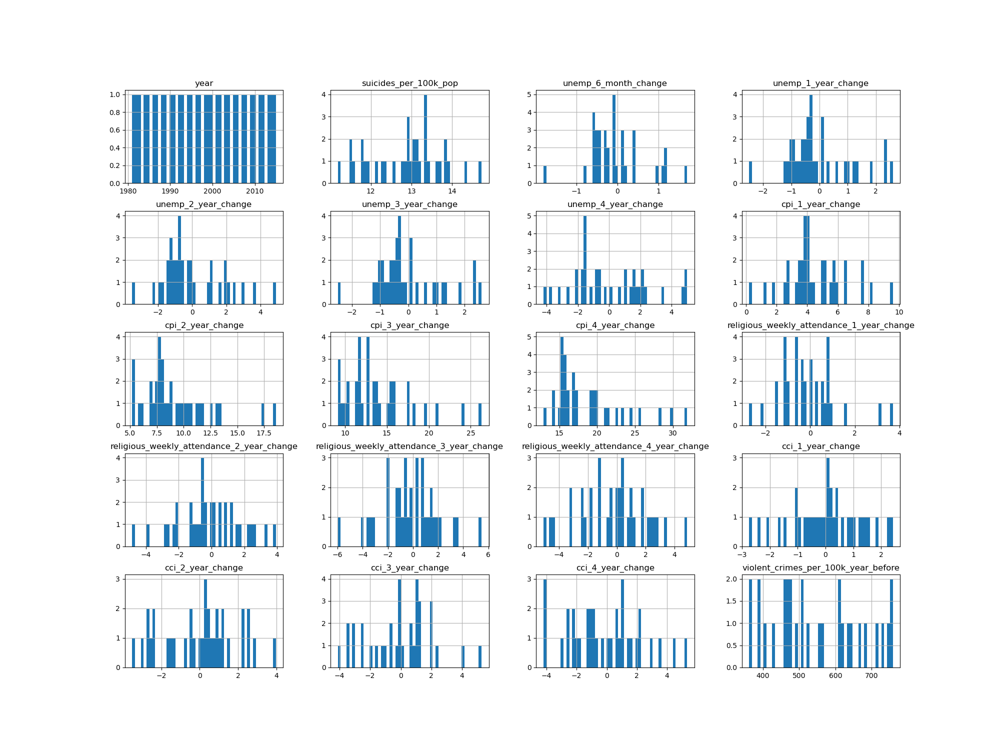

In [7]:
#Start by looking at the histograms of the columns:
df.hist(bins=50, figsize=(20,15))
plt.show()

Some notes on the histogram:

1. Year: ignore this, it is an index only.
1. Suicide/pop, the labels, shows that there is a median that most years sit around, but some years whose suicide count was off the mean. The reality is that the trend ivolves a dip over the course of a couple decades while in recent years it has been trending back up.
1. Many features here have a spike above the rest of the graph where most of their instances lie. Almost all of these are trend measurements, and so the interpretation is that generally, the change in the given timeframe is a certain mean, but to the left and right there are unusual instances/years where the change was much greater in a negative or positive direction. The exception is cpi, where the change is never negative, and the mean is close to 0 while anomaly years are much larger.

In [8]:
df_corr = df.corr()
df_corr['suicides_per_100k_pop'].sort_values(ascending=False)

suicides_per_100k_pop                        1.000000
cci_2_year_change                            0.211368
cci_3_year_change                            0.169579
religious_weekly_attendance_4_year_change    0.163442
cci_1_year_change                            0.146837
cpi_4_year_change                            0.135013
cci_4_year_change                            0.082955
cpi_3_year_change                            0.062762
religious_weekly_attendance_3_year_change    0.062603
religious_weekly_attendance_2_year_change   -0.009127
year                                        -0.011283
cpi_2_year_change                           -0.017746
unemp_4_year_change                         -0.021819
religious_weekly_attendance_1_year_change   -0.038248
cpi_1_year_change                           -0.083972
unemp_2_year_change                         -0.131406
violent_crimes_per_100k_year_before         -0.137954
unemp_3_year_change                         -0.159970
unemp_1_year_change         

This doesn't bode well. The best features we have (ignore year) are cci_2_year_change at a little over .2 and unemp_6_month_change at a little under .2. This is incredibly low. When I started this project with 4 features, this hurt my performance quite a bit, although I was able to get semi-reasonable predicitions. With almost 20 features, we have a better shot.

With basically no linear correlations, you can almost imagine a 3d space with scatter points as instances- of course, our space is 18-dimensional, so that's a reductionist visual. That doesn't mean there aren't more complex relationships though; I found that adding poly features was incredibly helpful for both train and test scores, which indicates to me that perhaps there are relationships in these features to the data that aren't linear.

### [↑ Index](#Index)

# Split Data and Transform with Pipeline

In [9]:
#Split into test and training
labels = df['suicides_per_100k_pop'].copy()
df = df.drop(columns=['year', 'suicides_per_100k_pop'])

X_train_unprepped, X_test_unprepped, y_train, y_test = tts(df,
                                                           labels,
                                                           test_size=.15,
                                                           random_state=seed)


In [10]:
# Imputer for missing data
# Poly features in pursuit of relationships
# Scaler for our features

poly_num_pipeline = Pipeline([
        ('simple_imputer', SimpleImputer()),
        ('poly_features', PolynomialFeatures(degree=4, include_bias=False)),
        ('std_scaler', StandardScaler()),
    ])

X_train = poly_num_pipeline.fit_transform(X_train_unprepped)
X_test = poly_num_pipeline.fit_transform(X_test_unprepped)

### [↑ Index](#Index)

<a name="Phase 1 Functions">
    <h1>Functions for Training</h1>
</a>

In [11]:
def get_rmse(model, X=X_train, y=y_train, cv=5):
    """Get the RMSE ofa model."""
    y_pred = cross_val_predict(model, X, y, cv=cv)
    rmse = f'{np.sqrt(mean_squared_error(y, y_pred)):.4f}'
    print(f'RMSE for {model} = {rmse}')
    return float(rmse)

def get_c_score(model, X=X_train, y=y_train, cv=3):
    y_pred = cross_val_predict(model, X, y, cv=cv)
    print(confusion_matrix(y, y_pred), '\n')
    print(f'{accuracy_score(y, y_pred):.5f}')
    
def perform_grid_search(model, param_grid, X=X_train, y=y_train, cv=2, v=1):
    """This function is shorthand as I use it on every model.
    Essentially, it creates a new GridSearchCV with the given info,
    fits to the train dataset, prints the best parameters,
    and returns the GridSearchCV element
    for making a model out of the best_estimators_.
    """
    grid_search = GridSearchCV(model, param_grid, cv=cv,
                           scoring='neg_mean_squared_error',
                           return_train_score=True, verbose=v, n_jobs=-1)
    grid_search.fit(X, y)
    print("Best params: ", grid_search.best_params_)
    return grid_search

def make_values_array(scale=1.6, start=1e-6, end=10):
    """Makes a huge array of values intended for use with param grids
    for GridSearchCV.
    """
    curr = start
    tols = []
    while curr < end:
        tols.append(curr)
        curr*=scale
    return tols

def make_coefs(scale=1.6, size=20):
    """Returns a list of coefs for use in grid search
    with the poly kernel for svr.
    """
    negative, positive = [],[0]
    curr = 1
    for _ in range(size):
        negative.append(-curr)
        positive.append(curr)
        curr*=scale
    coefs = negative + positive
    return coefs

def evaluate_on_test(model, X, y_test):
    preds = model.predict(X)
    rmse = f'{np.sqrt(mean_squared_error(y_test, preds)):.4f}'
    print(f'RMSE for {model} = {rmse}')

### [↑ Index](#Index)

# Models

### Base SVR

Let's see how an arbitrary SVR model does right out of the box:

In [12]:
svr_reg = SVR(kernel='poly', degree=2, C=100, epsilon=.1)
svr_reg.fit(X_train, y_train)
get_rmse(svr_reg)

RMSE for SVR(C=100, degree=2, kernel='poly') = 1.1761


1.1761

This error average divided by the mean of the labels is just a tad over 9%.

In [13]:
evaluate_on_test(svr_reg, X_test, y_test)

RMSE for SVR(C=100, degree=2, kernel='poly') = 1.1895


In test, we do just every so slightly worse. Time to do grid search...

### SVR Optimized by Grid Search

In [14]:
svm_param_grid = [
        {'kernel': ['linear'], 'C': make_values_array(scale=2, start=1e-6, end=10), 'tol': make_values_array(scale=10)},
        {'kernel': ['rbf'], 'C': make_values_array(scale=2, start=1e-6, end=10), 'tol': make_values_array(scale=10),
         'gamma': make_values_array(start=1e-2, end=100)},
        {'kernel': ['poly'], 'C': make_values_array(scale=2, start=1e-6, end=10), 'tol': make_values_array(scale=10),
         'degree': range(2,7), 'coef0': make_coefs()},
    ]

svm_search = perform_grid_search(SVR(), svm_param_grid)

Fitting 2 folds for each of 37968 candidates, totalling 75936 fits
Best params:  {'C': 2.097152, 'gamma': 0.01, 'kernel': 'rbf', 'tol': 1.0}


In [15]:
svr = svm_search.best_estimator_
svr.fit(X_train, y_train)
get_rmse(svr)

RMSE for SVR(C=2.097152, gamma=0.01, tol=1.0) = 0.7996


0.7996

In train we did much better having done the search... This is just over a 6% error.

In [16]:
evaluate_on_test(svr, X_test, y_test)

RMSE for SVR(C=2.097152, gamma=0.01, tol=1.0) = 0.9171


We lost accuracy on the test set, unfortunately, but are overall better off having searched. Also, we haven't overfitted, which is good!

For now, let's try some bagging.

### [↑ Index](#Index)

### Bagging With Default SVRs

In [17]:
bagger = BaggingRegressor(estimator=SVR(),
                          n_estimators=1000,
                          max_samples=15,
                          max_features=18,
                          bootstrap=True,
                          n_jobs=-1,
                          random_state=seed,
                          verbose=0)
bagger.fit(X_train, y_train)
get_rmse(bagger)

RMSE for BaggingRegressor(estimator=SVR(), max_features=18, max_samples=15,
                 n_estimators=1000, n_jobs=-1, random_state=40) = 0.7540


0.754

Not bad! This is just UNDER 6%.

In [18]:
evaluate_on_test(bagger, X_test, y_test)

RMSE for BaggingRegressor(estimator=SVR(), max_features=18, max_samples=15,
                 n_estimators=1000, n_jobs=-1, random_state=40) = 0.8214


We did better on test, making Bagging approach the better so far. Just over 6% for test is not shabby. Let's do a grid search using default SVR()'sand see what happens.

### Bagging With Default SVRs Optimized by Grid Search

After much tinkering, I found no way to use `GridSearchCV` for what I wanted to do. I didn't want to use cross validation, because the lowest you can go is `cv=2`, and that cuts my samples in half. This means you can't use `get_rmse` at all if your `max_samples` if larger than about 15. As I want to do more than that, I am left with the awkward option of making my own search and hoping that not cross-validating isn't an awful idea.

In [19]:
svr_bagging_param_grid = {'n_estimators': [2, 5, 8, 10, 12, 15, 20, 50, 100, 1000],
                          'max_samples': [2, 5, 10, 15, 20, 23, 25, 27, 29],
                          'max_features': [18],
                          'bootstrap': [True],
                          'n_jobs': [-1],
                          'random_state': [seed],
                          'verbose': [0]}

def bagging_search(svr_model, param_grid, X=X_train, y=y_train):
    """Grid Search for bagging with SVR models."""
    max_features = 18
    bootstrap = True
    n_jobs =- 1
    random_state = seed
    score = np.inf
    best_model = None
    best_est = None
    best_m_sam = None
    
    for est in param_grid['n_estimators']:
        for m_sam in param_grid['max_samples']:
            curr = BaggingRegressor(estimator=svr_model,
                                    n_estimators=est,
                                    max_samples=m_sam,
                                    max_features=max_features,
                                    bootstrap=True,
                                    n_jobs=n_jobs,
                                    random_state=random_state,
                                    verbose=0)
            curr.fit(X, y)
            preds = curr.predict(X)
            if mean_squared_error(y, preds) < score:
                score = mean_squared_error(y, preds)
                best_model = curr
                best_est = est
                best_m_sam = m_sam
    
    print(f"Best score was: {score} with {best_est} estimators and {best_m_sam} max samples each.")
    return best_model
            
    
default_svr_bagging_search = bagging_search(SVR(), svr_bagging_param_grid)

Best score was: 0.25973323067435744 with 2 estimators and 29 max samples each.


In [20]:
evaluate_on_test(default_svr_bagging_search, X_test, y_test)

RMSE for BaggingRegressor(estimator=SVR(), max_features=18, max_samples=29,
                 n_estimators=2, n_jobs=-1, random_state=40) = 0.7120


Well, this is definitely overfitting. The problem is, it's better than everything else... Also, the results are deceptive. Yes, the test score is incredulously higher, but the test score sits around the same place that all test scores sat. I've tried many param grids and the test score always ends around there. This is the lowest score I could find, and so even though the model clearly is lacking, it is the best.

What if I used a bagging concept with models starting from the best SVR estimator? Would that be better?

### Bagging With Best SVRs

In [21]:
best_svr_gs = svm_search.best_estimator_
bagger = BaggingRegressor(estimator=best_svr_gs,
                          n_estimators=100,
                          max_samples=2,
                          max_features=18,
                          bootstrap=True,
                          n_jobs=-1,
                          random_state=seed,
                          verbose=0)
bagger.fit(X_train, y_train)
get_rmse(bagger)

RMSE for BaggingRegressor(estimator=SVR(C=2.097152, gamma=0.01, tol=1.0),
                 max_features=18, max_samples=2, n_estimators=100, n_jobs=-1,
                 random_state=40) = 0.8682


0.8682

Not better yet than the bagging idea.. What about doing a grid search to find the best bagging approach using our best SVR?

### Bagging With Best SVRs Optimized by Grid Search

In [22]:
best_svr_bagging_search = bagging_search(best_svr_gs, svr_bagging_param_grid)

Best score was: 0.3792197806192962 with 2 estimators and 29 max samples each.


In [23]:
evaluate_on_test(best_svr_bagging_search, X_test, y_test)

RMSE for BaggingRegressor(estimator=SVR(C=2.097152, gamma=0.01, tol=1.0),
                 max_features=18, max_samples=29, n_estimators=2, n_jobs=-1,
                 random_state=40) = 0.8241


This does worse, although its train score is much better than many other models. It looks like using plain SVR's is better though.

Let's try Ridge Regression.

### [↑ Index](#Index)

### Base Ridge Regressor

In [24]:
ridge_reg = Ridge(alpha=1, solver="cholesky", random_state=seed)
ridge_reg.fit(X_train, y_train)
get_rmse(ridge_reg)
evaluate_on_test(ridge_reg, X_test, y_test)

RMSE for Ridge(alpha=1, random_state=40, solver='cholesky') = 1.0797
RMSE for Ridge(alpha=1, random_state=40, solver='cholesky') = 1.6719


Hmm. Already a bit worse than SVR.

### Ridge Regressor Optimized by Grid Search

In [25]:
#Now, try a grid search of SVR's (skipping lbfgs algorithm):
ridge_param_grid = {'alpha' : make_values_array(),
              'tol' : make_values_array(),
              'solver': ['svd', 'lsqr', 'saga'],
              'random_state': [seed]}

ridge_search = perform_grid_search(Ridge(), ridge_param_grid)

Fitting 2 folds for each of 3675 candidates, totalling 7350 fits
Best params:  {'alpha': 8.711228593176042, 'random_state': 40, 'solver': 'saga', 'tol': 0.1267650600228231}


In [26]:
ridge = ridge_search.best_estimator_
ridge.fit(X_train, y_train)
get_rmse(ridge)

RMSE for Ridge(alpha=8.711228593176042, random_state=40, solver='saga',
      tol=0.1267650600228231) = 0.8399


0.8399

In [27]:
evaluate_on_test(ridge, X_test, y_test)

RMSE for Ridge(alpha=8.711228593176042, random_state=40, solver='saga',
      tol=0.1267650600228231) = 0.8689


The Ridge Regressor best estimator ended up using stochastic gradient descent, which isn't really surprising. SGD has become my favorite through this project as I have experimented more and more.

The best RR is not better than the best bagger (using the default SVR()'s and grid searching). But, we have a "best" for: SVR, Bagging (with plain SVR()'s), Bagging (with best SVR()'s), and RR. Let's try some voting:

### [↑ Index](#Index)

### Voting Using Best Models

In [28]:
vr = VotingRegressor([('svr', svr), ('rr', ridge), ('bag_plain', default_svr_bagging_search), ('bag_best_svrs', best_svr_bagging_search)])
vr.fit(X_train, y_train)
"""
Because we included the bagging grid search models, we cannot
use my handy get_rmse() function. We will compute the score without
cross-validation, which is also how test always gets computed.
"""
vr_preds = vr.predict(X_train)
print(f"Score is: {mean_squared_error(y_train, vr_preds)}")

Score is: 0.20137941952408508


This looks really good, but it includes the incredibly-overfit bagging models... it's worth noting, however, that that is a better train score than even the bagger with default SVRs.

In [29]:
evaluate_on_test(vr, X_test, y_test)

RMSE for VotingRegressor(estimators=[('svr', SVR(C=2.097152, gamma=0.01, tol=1.0)),
                            ('rr',
                             Ridge(alpha=8.711228593176042, random_state=40,
                                   solver='saga', tol=0.1267650600228231)),
                            ('bag_plain',
                             BaggingRegressor(estimator=SVR(), max_features=18,
                                              max_samples=29, n_estimators=2,
                                              n_jobs=-1, random_state=40)),
                            ('bag_best_svrs',
                             BaggingRegressor(estimator=SVR(C=2.097152,
                                                            gamma=0.01,
                                                            tol=1.0),
                                              max_features=18, max_samples=29,
                                              n_estimators=2, n_jobs=-1,
                                        

As I expected, the voting is not better than the best bagging with default SVRs we found through a search.</span

### Voting Using the Top Two Models by Train Score

Let's use the two models with the best train scores: both bagging searches.

In [30]:
top_train_vr = VotingRegressor([('bag_plain', default_svr_bagging_search), ('bag_best_svrs', best_svr_bagging_search)])
top_train_vr.fit(X_train, y_train)
top_train_vr_preds = top_train_vr.predict(X_train)
print(f"Score is: {mean_squared_error(y_train, top_train_vr_preds)}")

Score is: 0.30513347168104404


In [31]:
evaluate_on_test(top_train_vr, X_test, y_test)

RMSE for VotingRegressor(estimators=[('bag_plain',
                             BaggingRegressor(estimator=SVR(), max_features=18,
                                              max_samples=29, n_estimators=2,
                                              n_jobs=-1, random_state=40)),
                            ('bag_best_svrs',
                             BaggingRegressor(estimator=SVR(C=2.097152,
                                                            gamma=0.01,
                                                            tol=1.0),
                                              max_features=18, max_samples=29,
                                              n_estimators=2, n_jobs=-1,
                                              random_state=40))]) = 0.7596


Looks like that didn't help. What about the models with the best test scores?

### Voting Using the Top Two Models by Test Score

In [32]:
top_test_vr = VotingRegressor([('bag_plain', default_svr_bagging_search), ('rr', ridge)])
top_test_vr.fit(X_train, y_train)
top_test_vr_preds = top_test_vr.predict(X_train)
print(f"Score is: {mean_squared_error(y_train, top_test_vr_preds)}")

Score is: 0.30443700993167727


In [33]:
evaluate_on_test(top_test_vr, X_test, y_test)

RMSE for VotingRegressor(estimators=[('bag_plain',
                             BaggingRegressor(estimator=SVR(), max_features=18,
                                              max_samples=29, n_estimators=2,
                                              n_jobs=-1, random_state=40)),
                            ('rr',
                             Ridge(alpha=8.711228593176042, random_state=40,
                                   solver='saga', tol=0.1267650600228231))]) = 0.7781


Looks like it wasn't better than the bagger grid search... I suspect this might be a case of good idea and wrong application, because bagging does SO well... but oh well.

Next I try SGD Regressor, which I try after I try everything else because it didn't do as well.

### [↑ Index](#Index)

### Base SGD Regressor

In [34]:
sgdr = SGDRegressor(max_iter=100000000)
sgdr.fit(X_train, y_train)
score = sgdr.score(X_train, y_train)
get_rmse(sgdr)

RMSE for SGDRegressor(max_iter=100000000) = 23961710836730.4648


23961710836730.465

Yikes. This doesn't work. Let's use Grid search.

### SGD Regressor Optimized by Grid Search

In [35]:
sgdr_param_grid = {'learning_rate': ['constant', 'optimal', 'invscaling', 'adaptive'],
                   'tol':make_values_array(),
                    'eta0': make_values_array(start=1e-8),
                    'early_stopping': [True, False]}

sgdr_search = perform_grid_search(SGDRegressor(), sgdr_param_grid)

Fitting 2 folds for each of 12600 candidates, totalling 25200 fits
Best params:  {'early_stopping': True, 'eta0': 1e-08, 'learning_rate': 'invscaling', 'tol': 0.0029514790517935307}


In [36]:
sgdr = sgdr_search.best_estimator_
sgdr.fit(X_train, y_train)
get_rmse(sgdr)

RMSE for SGDRegressor(early_stopping=True, eta0=1e-08, tol=0.0029514790517935307) = 12.8273


12.8273

Very inaccurate, unfortunately. It probably doesn't matter.

### [↑ Index](#Index)

# Model Summary

### By order run:

| Model | Train Score | Test Score |
| --- | --- | --- |
| SVR (best after grid search) | 0.7996 | 0.9171 |
| Bagging with default SVR() | 0.2597 (no cv) | 0.7120 |
| Bagging with the best SVR model | 0.5476 (no cv) | 0.9392 |
| Ridge Regressor (best after grid search) | 0.8399 | 0.8689 |
| Voter with all 4 models | 0.2244 (no cv) | 0.8495 |
| Voter with top 2 train score models | 0.3563 (no cv) | 0.8131 |
| Voter with top 2 test score models | 0.3044 (no cv) | 0.7781 |
| SGD Regressor | 12024157239925.635 | 12.8274 |

### By train score descending:

| Model | Train Score | Test Score |
| --- | --- | --- |
| Voter with all 4 models | 0.2244 (no cv) | 0.8495 |
| Bagging with default SVR() | 0.2597 (no cv) | 0.7120 |
| Voter with top 2 test score models | 0.3044 (no cv) | 0.7781 |
| Voter with top 2 train score models | 0.3563 (no cv) | 0.8131 |
| Bagging with the best SVR model | 0.5476 (no cv) | 0.9392 |
| SVR (best after grid search) | 0.7996 | 0.9171 |
| Ridge Regressor (best after grid search) | 0.8399 | 0.8689 |
| SGD Regressor | 12024157239925.635 | 12.8274 |

### By test score descending:

| Model | Train Score | Test Score |
| --- | --- | --- |
| Bagging with default SVR() | 0.2597 (no cv) | 0.7120 |
| Voter with top 2 test score models | 0.3044 (no cv) | 0.7781 |
| Voter with top 2 train score models | 0.3563 (no cv) | 0.8131 |
| Voter with all 4 models | 0.2244 (no cv) | 0.8495 |
| Ridge Regressor (best after grid search) | 0.8399 | 0.8689 |
| Bagging with the best SVR model | 0.5476 (no cv) | 0.9392 |
| SVR (best after grid search) | 0.7996 | 0.9171 |
| SGD Regressor | 12024157239925.635 | 12.8274 |

<a name="p1-conclusions">
    <h1>Conclusions</h1>
</a>

The best model is the bagger that used default SVR's. Future work could certainly be done to figure out why it overfits so horrendously and explore why the model that overfitted the most also was the best. It seems like there's more power in bagging that I haven't unlocked yet; perhaps using SVR's beyond the default, or using some combination, is worth trying. Ultimately, this points to a need for data, but it was incredibly fun to try to build a model given a lack of data, and perhaps an exercise with real-world benefit in situations where data is not really available/affordable. We were able to essentially halve our error. The rmse divided by the labels' mean is about 5.5%, which was no easy task to get to.

### [↑ Index](#Index)

<br/><br/><h1 style="text-align:center;font-size:3em;margin:auto">Phase 2</h1><br/><br/>

# Functions and Pipelines

In [37]:
def create_delta_attrs(dataframe):
    """For each attr type, get the 1yp of the type, and in a sub iteration
    get all the others. Perform all the time deltas relative to the 1yp
    attr and add to dataframe.
    """
    new_df = dataframe.copy()
    for col in dataframe:
        attr_type = col[:len(col)-4]
        year = int(col[len(col)-3])
        if year == 1:
            for subcol in dataframe:
                sub_attr_type = subcol[:len(subcol)-4]
                sub_year = int(subcol[len(subcol)-3])
                if sub_attr_type == attr_type and sub_year != 1:
                    delta = dataframe[col] - dataframe[subcol]
                    delta_name = sub_attr_type + '_' + str(sub_year - 1) + 'y_change'
                    new_df[delta_name] = delta
    return new_df


def get_rmse(model, X, y, cv=3):
    """Get the RMSE of a model for train."""
    y_pred = cross_val_predict(model, X, y, cv=cv)
    rmse = f'{np.sqrt(mean_squared_error(y, y_pred)):.4f}'
    print(f'RMSE for {model} = {rmse}')
    return float(rmse)


def evaluate_on_test(model, X, y):
    """Get the RMSE of a model for test."""
    preds = model.predict(X)
    rmse = f'{np.sqrt(mean_squared_error(y, preds)):.4f}'
    print(f'RMSE for {model} = {rmse}')
    

def plot_score_per_epoch(X):
    """Plot the RMSE's of a set of epochs.
    X should be some array of scores (the index will
    be used as the epoch number, so they should obviously
    come in sequential order).
    """
    fig = plt.figure()
    ax = fig.add_subplot()
    ax.plot(range(1, len(X)+1), X, 'r-')
    ax.set_xlabel('Epoch')
    ax.set_ylabel('Negative RMSE')
    plt.show()

    
def plot_scores_against_params_3d(X,
                                  y,
                                  bp,
                                  search_boxes,
                                  axes_names: list,
                                  all_scores: bool=True):
    """Plot scores (RMSE) as colored 3d scatter points
    with 3 hyperparameters as the axes.
    
    bp is the hyperparameters for the best score.
    axes_names is a list of the labels for each axis.
    
    search_boxes will be plotted as to make boxes for each search. It is a list
    where every 16 specify the right points. It can also be a list of box planes
    to make boxes with sides. In this case all_scores should be set to false
    (showing all plots vs best scores).
    """
    fig = plt.figure(figsize=(20, 13), dpi=80)
    ax_1 = fig.add_subplot(projection='3d')

    swapped_X = np.swapaxes(X,0,1)
    p = ax_1.scatter3D(swapped_X[0],
                       swapped_X[1],
                       swapped_X[2],
                       c=y,
                       cmap=cm.coolwarm_r,
                       alpha=.5 if all_scores else 1)
    
    if all_scores:#Showing the grid results with box outlines
        swapped_search = np.swapaxes(search_boxes, 0, 1)
        for i in range(0, len(swapped_search[0]), 16):
            ax_1.plot(swapped_search[0][i:i+16],
                      swapped_search[1][i:i+16],
                      swapped_search[2][i:i+16],
                      c='black',
                      alpha=.5)
    else:
        search_boxes_fills_pivot = np.swapaxes(search_boxes_fills,0,1)
        b = ax_1.scatter3D(search_boxes_fills_pivot[0],
                           search_boxes_fills_pivot[1],
                           search_boxes_fills_pivot[2],
                           c='k',
                           alpha=0)
        
        #^Just to set the grid dimensions; using the
        #poly3D tool below won't adjust the view
        color_toggle = False
        for i in range(0, len(search_boxes_fills), 24):
            color_toggle = not color_toggle
            ax_1.add_collection3d(
                Poly3DCollection([search_boxes_fills[i:i+4],
                                  search_boxes_fills[i+4:i+8],
                                  search_boxes_fills[i+8:i+12],
                                  search_boxes_fills[i+12:i+16],
                                  search_boxes_fills[i+16:i+20],
                                  search_boxes_fills[i+20:i+24]],
                                  facecolors=(.6,.6,.7) if color_toggle else (.6, .6, .8),
                                  linewidths=.4,
                                  edgecolors='k',
                                  alpha=.1))

    ax_1.set_xlabel(axes_names[0])
    ax_1.set_ylabel(axes_names[1])
    ax_1.set_zlabel(axes_names[2])

    a = ax_1.scatter3D(bp[0], bp[1], bp[2], color='green')
    
    fig.colorbar(p, ax=ax_1, label="Negative RMSE")
    plt.show()
    

def narrowing_grid_search(iter: int,
                          c_upper: float = 10,
                          c_lower: float = .0001,
                          tol_upper: float = 2,
                          tol_lower: float = .001,
                          ep_lower: float = 1e-6,
                          ep_upper: float = 1,
                          early_stopping: float = .005,
                          stopping_timeframe: int = 5,
                          plot_best_only: bool = False,
                          dont_plot_first_iter: bool = True):
    """
    Optimization algorithm to find best hyperparameters for the SVR model.
    
    Early stopping works by having a stopping criterion (as a percentage), which
    is a percentage of change in the cost function, as well as a timeframe
    (number of iters), which is relevant as sometimes changes might be jumpy
    due to the randomness factor.
    """
    best_score = -np.inf
    best_estimator = None
    
    (scores,
    params_sets,
    epochs,
    best_p,
    record_scores,
    record_scores_params_sets,
    search_boxes_all,
    search_boxes,
    search_boxes_fills) = [], [], [], [], [], [], [], [], []
    
    params_multiplier = 5
    
    #score at start of a frame.
    early_stopping_best_at_start = -1
    #Keep track of the early stopping timeframe
    early_stopping_frame_count = 1
    
    for i in range(iter):
        #Search domain parameters
        svm_param_grid = [{
            'kernel': ['poly'],
            'C': np.arange(c_lower, c_upper, step=(c_upper-c_lower)/1000),
            'tol': np.arange(tol_lower, tol_upper, step=(tol_upper-tol_lower)/1000),
            'degree': [2],
            'coef0': [10],
            'epsilon': np.arange(ep_lower, ep_upper, step=(ep_upper-ep_lower)/1000)}]
    
        #Search entity
        svm_rgs = RandomizedSearchCV(SVR(),
                                     svm_param_grid,
                                     cv=3,
                                     scoring='neg_root_mean_squared_error',
                                     return_train_score=True,
                                     n_iter=500,
                                     n_jobs=-1,
                                     random_state=20)
    
        svm_rgs.fit(X_train, y_train)
        score = svm_rgs.best_score_
        results = svm_rgs.cv_results_
        
        #Used for visualization functions
        new_scores, new_params_sets = [], []
        for result_score, params in zip(results["mean_test_score"], results["params"]):
            new_scores.append(result_score)
            new_params_sets.append([params['C'], params['tol'], params['epsilon']])

        #Used for visualization functions
        if ((i == 0 and not dont_plot_first_iter) or i != 0):
            search_boxes_all.extend([[c_lower, tol_lower, ep_lower],
                                     [c_upper, tol_lower, ep_lower],
                                     [c_upper, tol_upper, ep_lower],
                                     [c_lower, tol_upper, ep_lower],
                                     [c_lower, tol_lower, ep_lower],
                                     [c_lower, tol_lower, ep_upper],
                                     [c_upper, tol_lower, ep_upper],
                                     [c_upper, tol_lower, ep_lower],
                                     [c_upper, tol_lower, ep_upper],
                                     [c_upper, tol_upper, ep_upper],
                                     [c_upper, tol_upper, ep_lower],
                                     [c_upper, tol_upper, ep_upper],
                                     [c_lower, tol_upper, ep_upper],
                                     [c_lower, tol_upper, ep_lower],
                                     [c_lower, tol_upper, ep_upper],
                                     [c_lower, tol_lower, ep_upper]])
            if not plot_best_only:
                scores.extend(new_scores)
                params_sets.extend(new_params_sets)
            else:
                scores = new_scores
                params_sets = new_params_sets
        
        #Case that a new best score is found this iter
        if score > best_score:
            print(f"Iter {i+1}: Score is {score} (better)")
            best_score = score
            best_estimator = svm_rgs.best_estimator_
            
            best_params = svm_rgs.best_params_
            best_c = best_params['C']
            best_tol = best_params['tol']
            best_ep = best_params['epsilon']
            best_p = [best_c, best_tol, best_ep]
            
            #Used for visualization functions
            record_scores.append(score)
            record_scores_params_sets.append(best_p)
            
            #Used for visualization functions
            if ((i == 0 and not dont_plot_first_iter) or i != 0):
                search_boxes.extend([
                    [c_lower, tol_lower, ep_lower],
                    [c_upper, tol_lower, ep_lower],
                    [c_upper, tol_upper, ep_lower],
                    [c_lower, tol_upper, ep_lower],
                    [c_lower, tol_lower, ep_lower],
                    [c_lower, tol_lower, ep_upper],
                    [c_upper, tol_lower, ep_upper],
                    [c_upper, tol_lower, ep_lower],
                    [c_upper, tol_lower, ep_upper],
                    [c_upper, tol_upper, ep_upper],
                    [c_upper, tol_upper, ep_lower],
                    [c_upper, tol_upper, ep_upper],
                    [c_lower, tol_upper, ep_upper],
                    [c_lower, tol_upper, ep_lower],
                    [c_lower, tol_upper, ep_upper],
                    [c_lower, tol_lower, ep_upper]])
                search_boxes_fills.extend([
                    [c_lower, tol_lower, ep_lower],
                    [c_upper, tol_lower, ep_lower],
                    [c_upper, tol_upper, ep_lower],
                    [c_lower, tol_upper, ep_lower]])
                search_boxes_fills.extend([
                    [c_lower, tol_lower, ep_upper],
                    [c_upper, tol_lower, ep_upper],
                    [c_upper, tol_upper, ep_upper],
                    [c_lower, tol_upper, ep_upper]])
                search_boxes_fills.extend([
                    [c_lower, tol_lower, ep_lower],
                    [c_lower, tol_upper, ep_lower],
                    [c_lower, tol_upper, ep_upper],
                    [c_lower, tol_lower, ep_upper]])
                search_boxes_fills.extend([
                    [c_upper, tol_lower, ep_lower],
                    [c_upper, tol_upper, ep_lower],
                    [c_upper, tol_upper, ep_upper],
                    [c_upper, tol_lower, ep_upper]])
                search_boxes_fills.extend([
                    [c_lower, tol_lower, ep_lower],
                    [c_upper, tol_lower, ep_lower],
                    [c_upper, tol_lower, ep_upper],
                    [c_lower, tol_lower, ep_upper]])
                search_boxes_fills.extend([
                    [c_lower, tol_upper, ep_lower],
                    [c_upper, tol_upper, ep_lower],
                    [c_upper, tol_upper, ep_upper],
                    [c_lower, tol_upper, ep_upper]])

            #Reset the params multiplier
            params_multiplier = 5
            
        #Case that a better score is not found
        else:
            print(f"Iter {i+1}: Score is {score} (not better)")
            #Increase multiplier
            params_multiplier*=2
        
        #Reagrdless of case, set new domain boundaries
        #for the next search based on the current best
        #hyperparameters and a multiplier value that
        #Allows search to focus on smaller domains
        c_lower   = best_c   - abs(best_c)/params_multiplier
        c_upper   = best_c   + abs(best_c)/params_multiplier
        tol_lower = best_tol - abs(best_tol)/params_multiplier
        tol_upper = best_tol + abs(best_tol)/params_multiplier
        ep_lower  = best_ep  - abs(best_ep)/params_multiplier
        ep_upper  = best_ep  + abs(best_ep)/params_multiplier
        
        #Used for visualization functions
        epochs += [best_score]
        
        #Check that the best score is not being placed in
        #params_sets or scores. Otherwise, matplotlib
        #does not work as desired when plotting that particular
        #scatterpoint.
        i = 0
        while (i < len(params_sets)):
            if params_sets[i] == best_p:
                params_sets.pop(i)
                scores.pop(i)
            i += 1
        
        #Increase the timeframe- if this gets too high
        #the function will exit early because better scores
        #are not being found fast enough.
        early_stopping_frame_count += 1
        
        #Reset the early stopping timeframe and current best score of the
        #given es timeframe if the score has improved by at least the 
        #early stopping amount specified.
        if early_stopping_best_at_start == -1 or (
            early_stopping_best_at_start-best_score)/early_stopping_best_at_start > early_stopping:
            early_stopping_frame_count = 1
            early_stopping_best_at_start = best_score
        
        #Early stopping
        if early_stopping_frame_count == stopping_timeframe:
            print(f"Early stopping because within the last",
                  f"{stopping_timeframe} iterations, the score has not",
                  f"reduced by {early_stopping*100}%") 
            return (
                best_estimator,
                best_p,
                scores,
                params_sets,
                record_scores,
                record_scores_params_sets,
                search_boxes_all,
                search_boxes,
                search_boxes_fills,
                epochs)
    
    #Return after all iterations run
    return (
        best_estimator,
        best_p,
        scores,
        params_sets,
        record_scores,
        record_scores_params_sets,
        search_boxes_all,
        search_boxes,
        search_boxes_fills,
        epochs)



def narrowing_freg_gs(iter: int,
                      max_depth_u: int = 10,
                      max_depth_l: int = 1,
                      n_est_u: int = 50,
                      n_est_l: int = 5,
                      min_samples_leaf_u: int = 10,
                      min_samples_leaf_l: int = 1,
                      plot_best_only: bool = False,
                      dont_plot_first_iter: bool = True):
    """non-recursive version"""
    best_score = -np.inf
    best_estimator = None
    scores, params_sets, epochs, best_p, record_scores, record_scores_params_sets, search_boxes_all, search_boxes, search_boxes_fills = [], [], [], [], [], [], [], [], []
    for i in range(iter):
        if 0 in [len(np.arange(max_depth_l, max_depth_u, step=1)), len(np.arange(n_est_l, n_est_u, step=1)), len(np.arange(min_samples_leaf_l, min_samples_leaf_u, step=1))]:
            #Exhausted all hp space
            print(f"Early stopping because the bandwidth of the search has shrunk as much as possible.")
            return best_estimator, best_p, scores, params_sets, record_scores, record_scores_params_sets, search_boxes_all, search_boxes, search_boxes_fills, epochs
        freg_param_grid = [{'max_depth': np.arange(max_depth_l, max_depth_u, step=1),
                            'n_estimators': np.arange(n_est_l, n_est_u, step=1),
                            'min_samples_leaf': np.arange(min_samples_leaf_l, min_samples_leaf_u, step=1)}]
    
        freg_rgs = RandomizedSearchCV(RandomForestRegressor(),
                                      freg_param_grid,
                                      cv=3,
                                      scoring='neg_mean_squared_error',
                                      return_train_score=False,
                                      n_iter=50,
                                      n_jobs=-1,
                                      random_state=seed)
    
        freg_rgs.fit(X_train, y_train)

        score = freg_rgs.best_score_
        results = freg_rgs.cv_results_
        
        new_scores, new_params_sets = [], []
        #^these are for plotting scores with their params
        for result_score, params in zip(results["mean_test_score"], results["params"]):
            new_scores.append(result_score)
            new_params_sets.append([params['max_depth'], params['n_estimators'], params['min_samples_leaf']])
            
        if ((i == 0 and not dont_plot_first_iter) or i != 0):
            search_boxes_all.extend([[max_depth_l, n_est_l, min_samples_leaf_l],
                                    [max_depth_u, n_est_l, min_samples_leaf_l],
                                    [max_depth_u, n_est_u, min_samples_leaf_l],
                                    [max_depth_l, n_est_u, min_samples_leaf_l],
                                    [max_depth_l, n_est_l, min_samples_leaf_l],
                                    [max_depth_l, n_est_l, min_samples_leaf_u],
                                    [max_depth_u, n_est_l, min_samples_leaf_u],
                                    [max_depth_u, n_est_l, min_samples_leaf_l],
                                    [max_depth_u, n_est_l, min_samples_leaf_u],
                                    [max_depth_u, n_est_u, min_samples_leaf_u],
                                    [max_depth_u, n_est_u, min_samples_leaf_l],
                                    [max_depth_u, n_est_u, min_samples_leaf_u],
                                    [max_depth_l, n_est_u, min_samples_leaf_u],
                                    [max_depth_l, n_est_u, min_samples_leaf_l],
                                    [max_depth_l, n_est_u, min_samples_leaf_u],
                                    [max_depth_l, n_est_l, min_samples_leaf_u]])
            if not plot_best_only:
                scores.extend(new_scores)
                params_sets.extend(new_params_sets)
            else:
                scores = new_scores
                params_sets = new_params_sets
            
        if score > best_score:
            print(f"Iter {i+1}: Score is {score} (better)")
            best_score = score
            best_estimator = freg_rgs.best_estimator_
        
            best_params = freg_rgs.best_params_
            best_md = best_params['max_depth']
            best_n_est = best_params['n_estimators']
            best_msl = best_params['min_samples_leaf']
            best_p = [best_md, best_n_est, best_msl]
            
            record_scores.append(score)
            record_scores_params_sets.append(best_p)
            
            if ((i == 0 and not dont_plot_first_iter) or i != 0):
                search_boxes.extend([[max_depth_l, n_est_l, min_samples_leaf_l],
                                    [max_depth_u, n_est_l, min_samples_leaf_l],
                                    [max_depth_u, n_est_u, min_samples_leaf_l],
                                    [max_depth_l, n_est_u, min_samples_leaf_l],
                                    [max_depth_l, n_est_l, min_samples_leaf_l],
                                    [max_depth_l, n_est_l, min_samples_leaf_u],
                                    [max_depth_u, n_est_l, min_samples_leaf_u],
                                    [max_depth_u, n_est_l, min_samples_leaf_l],
                                    [max_depth_u, n_est_l, min_samples_leaf_u],
                                    [max_depth_u, n_est_u, min_samples_leaf_u],
                                    [max_depth_u, n_est_u, min_samples_leaf_l],
                                    [max_depth_u, n_est_u, min_samples_leaf_u],
                                    [max_depth_l, n_est_u, min_samples_leaf_u],
                                    [max_depth_l, n_est_u, min_samples_leaf_l],
                                    [max_depth_l, n_est_u, min_samples_leaf_u],
                                    [max_depth_l, n_est_l, min_samples_leaf_u]])
                search_boxes_fills.extend([[max_depth_l, n_est_l, min_samples_leaf_l], [max_depth_u, n_est_l, min_samples_leaf_l], [max_depth_u, n_est_u, min_samples_leaf_l], [max_depth_l, n_est_u, min_samples_leaf_l]])#bottom
                search_boxes_fills.extend([[max_depth_l, n_est_l, min_samples_leaf_u], [max_depth_u, n_est_l, min_samples_leaf_u], [max_depth_u, n_est_u, min_samples_leaf_u], [max_depth_l, n_est_u, min_samples_leaf_u]])#top
                search_boxes_fills.extend([[max_depth_l, n_est_l, min_samples_leaf_l], [max_depth_l, n_est_u, min_samples_leaf_l], [max_depth_l, n_est_u, min_samples_leaf_u], [max_depth_l, n_est_l, min_samples_leaf_u]])
                search_boxes_fills.extend([[max_depth_u, n_est_l, min_samples_leaf_l], [max_depth_u, n_est_u, min_samples_leaf_l], [max_depth_u, n_est_u, min_samples_leaf_u], [max_depth_u, n_est_l, min_samples_leaf_u]])
                search_boxes_fills.extend([[max_depth_l, n_est_l, min_samples_leaf_l], [max_depth_u, n_est_l, min_samples_leaf_l], [max_depth_u, n_est_l, min_samples_leaf_u], [max_depth_l, n_est_l, min_samples_leaf_u]])
                search_boxes_fills.extend([[max_depth_l, n_est_u, min_samples_leaf_l], [max_depth_u, n_est_u, min_samples_leaf_l], [max_depth_u, n_est_u, min_samples_leaf_u], [max_depth_l, n_est_u, min_samples_leaf_u]])
            
            max_depth_u = int(best_md) + 10
            max_depth_l = int(best_md) - 10
            n_est_u = int(best_n_est) + 10
            n_est_l = int(best_n_est) - 10
            min_samples_leaf_u = int(best_msl) + 10
            min_samples_leaf_l = int(best_msl) - 10 
        else:#Better score not found
            print(f"Iter {i+1}: Score is {score} (not better)")
            
        max_depth_l   += 1
        max_depth_u   -= 1
        n_est_l += 1
        n_est_u -= 1
        min_samples_leaf_l  += 1
        min_samples_leaf_u  -= 1
        
        epochs += [best_score]
        
        i = 0
        while (i < len(params_sets)):
            if params_sets[i] == best_p:
                params_sets.pop(i)
                scores.pop(i)
            i += 1
            
    return best_estimator, best_p, scores, params_sets, record_scores, record_scores_params_sets, search_boxes_all, search_boxes, search_boxes_fills, epochs


num_pipeline = Pipeline([
        ('simple_imputer', SimpleImputer()),
        ('poly_features', PolynomialFeatures(degree=5, include_bias=False)),
        ('std_scaler', StandardScaler()),
    ])

num_pipeline_no_poly = Pipeline([
        ('simple_imputer', SimpleImputer()),
        ('std_scaler', StandardScaler()),
    ])

### [↑ Index](#Index)

# Suicides per pop dataset

In [38]:
df = pd.read_csv('suicide_data_p2.csv')

In [39]:
#Split into test and training
labels = df['suicides_per_100k_pop'].copy()
df = df.drop(columns=['year', 'suicides_per_100k_pop', 'suicides_increased'])

full_df = create_delta_attrs(df)

df = num_pipeline.fit_transform(df)

X_train, X_test, y_train, y_test = tts(df,
                                       labels,
                                       test_size=.25,
                                       random_state=seed)

<a name="suicide-svr">
    <h2>SVR</h2>
</a>

<a name="suicide-svr-dm">
    <h3>Default Model</h3>
</a>

In [40]:
svr = SVR()
svr.fit(X_train, y_train)
get_rmse(svr, X_train, y_train)
evaluate_on_test(svr, X_test, y_test)

RMSE for SVR() = 0.4490
RMSE for SVR() = 0.3413


<a name="suicide-svr-tm">
    <h3>Trained Model</h3>
</a>

In [41]:
svr_be, svr_bp, scores, param_sets, record_scores, record_scores_param_sets, search_boxes_all, search_boxes, search_boxes_fills, epochs = narrowing_grid_search(20)

Iter 1: Score is -0.3363259714579602 (better)
Iter 2: Score is -0.33626502604660263 (better)
Iter 3: Score is -0.3362237360743349 (better)
Iter 4: Score is -0.3361953725790476 (better)
Iter 5: Score is -0.33617570883125475 (better)
Early stopping because within the last 5 iterations, the score has not reduced by 0.5%


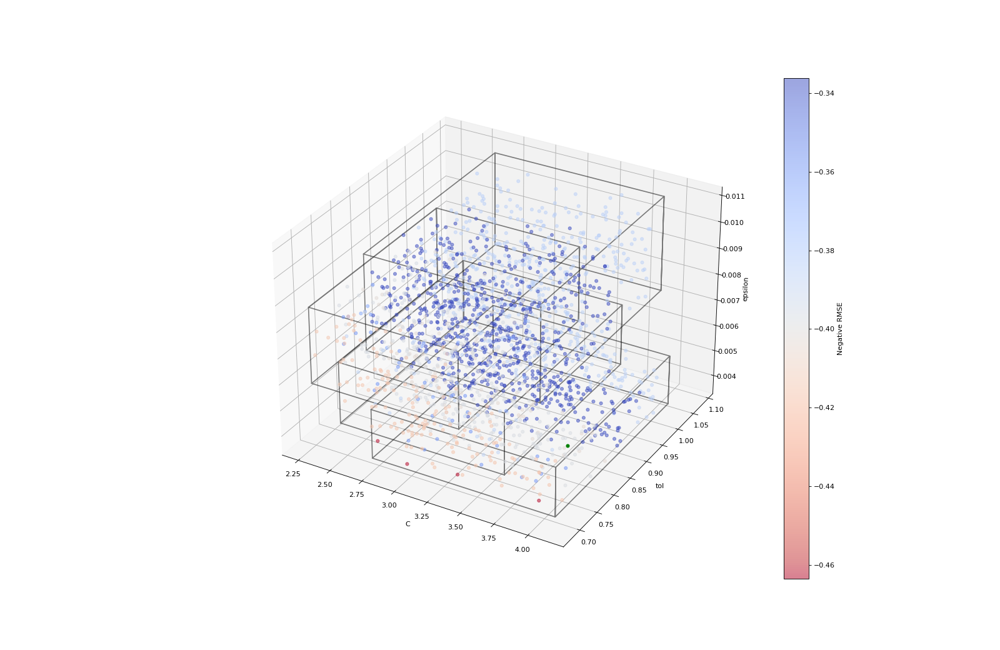

In [42]:
plot_scores_against_params_3d(param_sets, scores, svr_bp, search_boxes_all, ['C', 'tol', 'epsilon'])

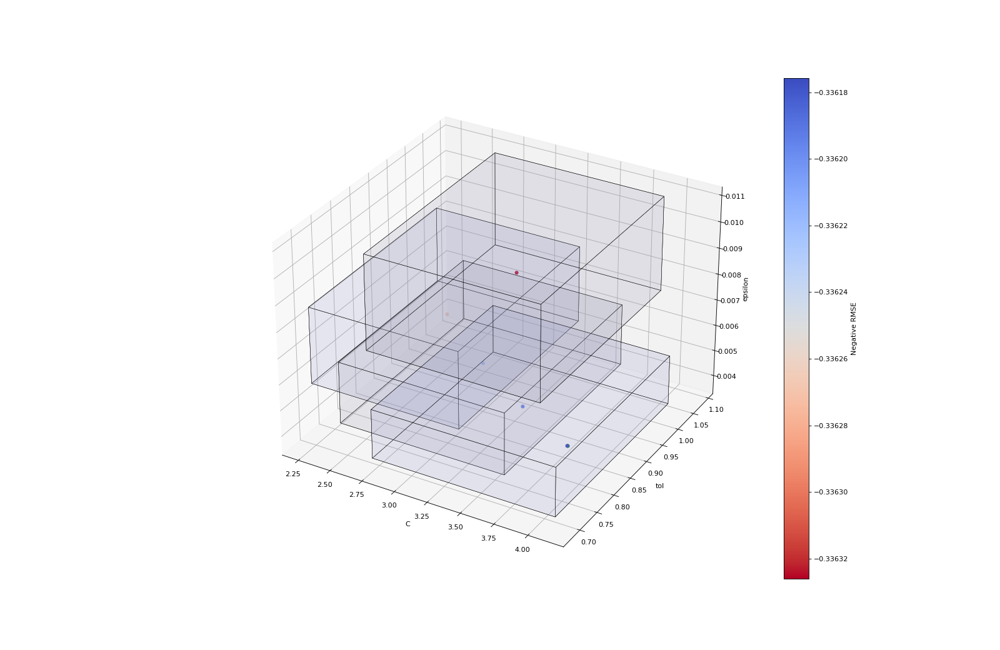

In [43]:
plot_scores_against_params_3d(record_scores_param_sets, record_scores, svr_bp, search_boxes_fills, ['C', 'tol', 'epsilon'], all_scores=False)

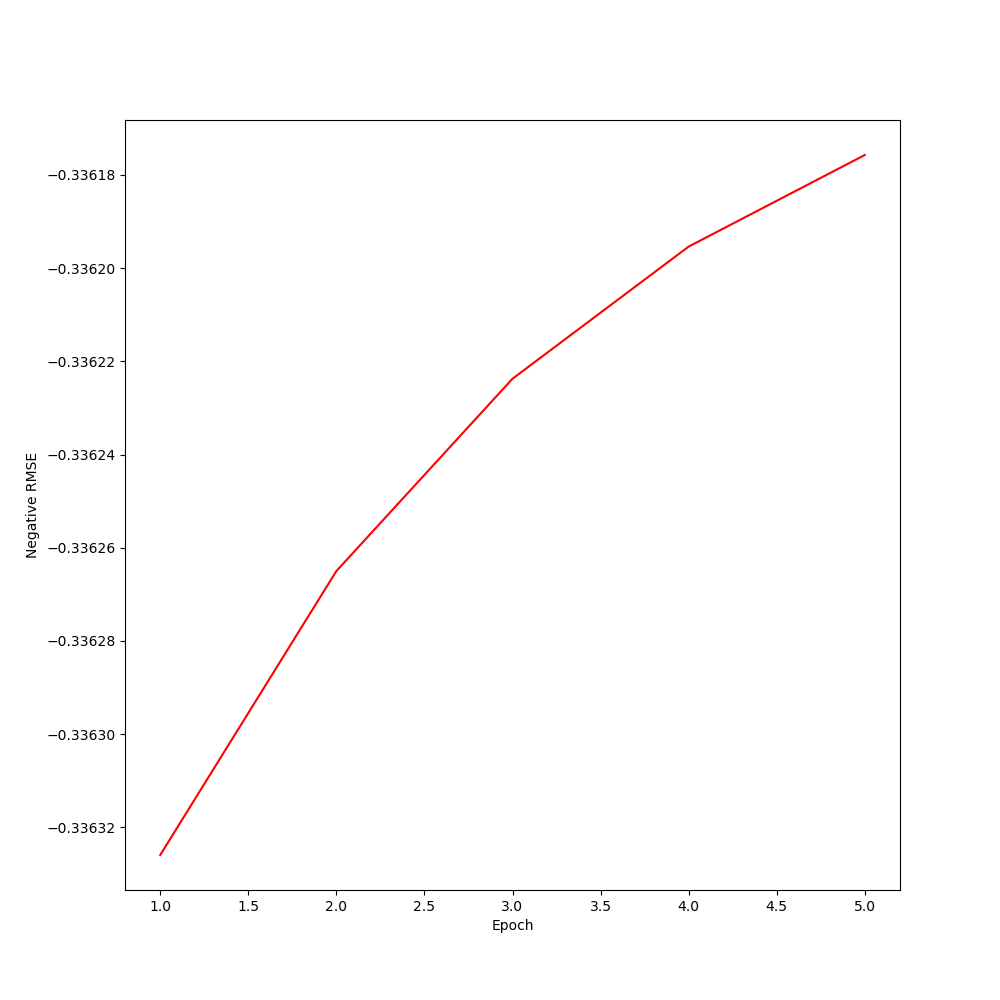

In [44]:
plot_score_per_epoch(epochs)

In [45]:
best_svr = svr_be
best_svr.fit(X_train, y_train)
get_rmse(best_svr, X_train, y_train)
evaluate_on_test(best_svr, X_test, y_test)

RMSE for SVR(C=3.789439302547198, coef0=10, degree=2, epsilon=0.0038099830000662884,
    kernel='poly', tol=0.8475812051734837) = 0.3395
RMSE for SVR(C=3.789439302547198, coef0=10, degree=2, epsilon=0.0038099830000662884,
    kernel='poly', tol=0.8475812051734837) = 0.3330


<a name="suicide-fr">
    <h2>Forest Regression</h2>
</a>

<a name="suicide-fr-dm">
    <h3>Default Model</h3>
</a>

In [46]:
#forest regression
freg = RandomForestRegressor(n_estimators=50, random_state=seed)
freg.fit(X_train, y_train)
get_rmse(freg, X_train, y_train)
evaluate_on_test(freg, X_test, y_test)

RMSE for RandomForestRegressor(n_estimators=50, random_state=40) = 0.5353
RMSE for RandomForestRegressor(n_estimators=50, random_state=40) = 0.3211


<a name="suicide-fr-tm">
    <h3>Trained Model</h3>
</a>

Forest Regression  
  
Why use?  
Forest Regression solves a lot of issues by virtue of being a randomized ensemble. We have a LOT of noise in the OP data set, and although it theoretically is a linear problem, the linearity is a bit lacking. It's making SVR fail because SVR and other linear algorithms literally have a single prediction line shooting through the dozens of dimensions after performign on noise. The spread is too wide for this to work.  
  
The biggest reason why FR can be used is that the test set is a subset of our train set primarily, and though it would be nice if it could be used as a future predictor, it won't be used as such. FR struggles from being unable to extrapolate results beyond the domain of its training set because all the trees have determined their splits based on train data, which guarantees issues if new samples move beyond the train domains.

Perhaps this shouldn't be using a mechanism to try to quickly find the parameters... looking at some of the first results, I'm seeing a wide spread with lots of different results close together and it makes me wonder how "hilly" the hyperparameter space is. If we try to just travel down one of these slopes, we might hit the wrong one. The solution is finding the balance between going down the slope and testing every set. I want to get a good enough coverage of each epoch that I can semi-safely say which one was the best, but not overkill.

In [47]:
freg_be, freg_bp, scores, param_sets, record_scores, record_scores_param_sets, search_boxes_all, search_boxes, search_boxes_fills, epochs = narrowing_freg_gs(20)

Iter 1: Score is -0.24534799398437634 (better)
Iter 2: Score is -0.2525641829588436 (not better)
Iter 3: Score is -0.23057061467156217 (better)
Iter 4: Score is -0.2364073801915092 (not better)
Iter 5: Score is -0.23757430851455474 (not better)
Iter 6: Score is -0.2553832821528004 (not better)
Iter 7: Score is -0.2464757262641369 (not better)
Iter 8: Score is -0.24238933479877015 (not better)
Iter 9: Score is -0.23327456323821294 (not better)
Iter 10: Score is -0.23226264846634606 (not better)
Iter 11: Score is -0.2409361054647616 (not better)
Iter 12: Score is -0.22926203423408453 (better)
Iter 13: Score is -0.24318289058502654 (not better)
Iter 14: Score is -0.23988376194975303 (not better)
Iter 15: Score is -0.2751434675145435 (not better)
Iter 16: Score is -0.22800304298782206 (better)
Iter 17: Score is -0.25514408602295396 (not better)
Iter 18: Score is -0.24673068104969798 (not better)
Iter 19: Score is -0.22513699930243955 (better)
Iter 20: Score is -0.24994372787734234 (not bet

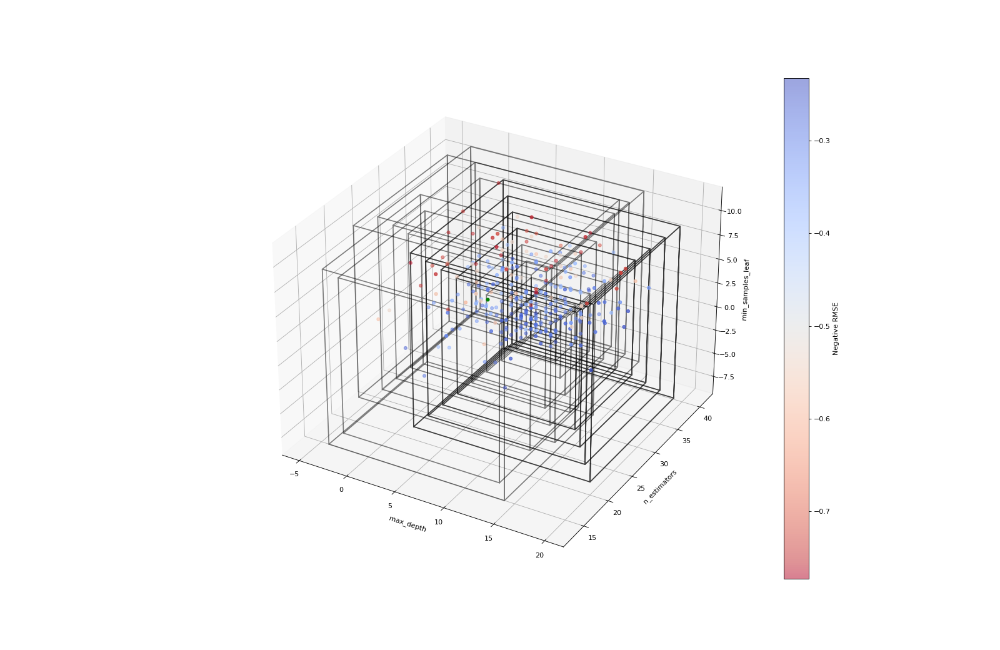

In [48]:
plot_scores_against_params_3d(param_sets, scores, freg_bp, search_boxes_all, ['max_depth', 'n_estimators', 'min_samples_leaf'])

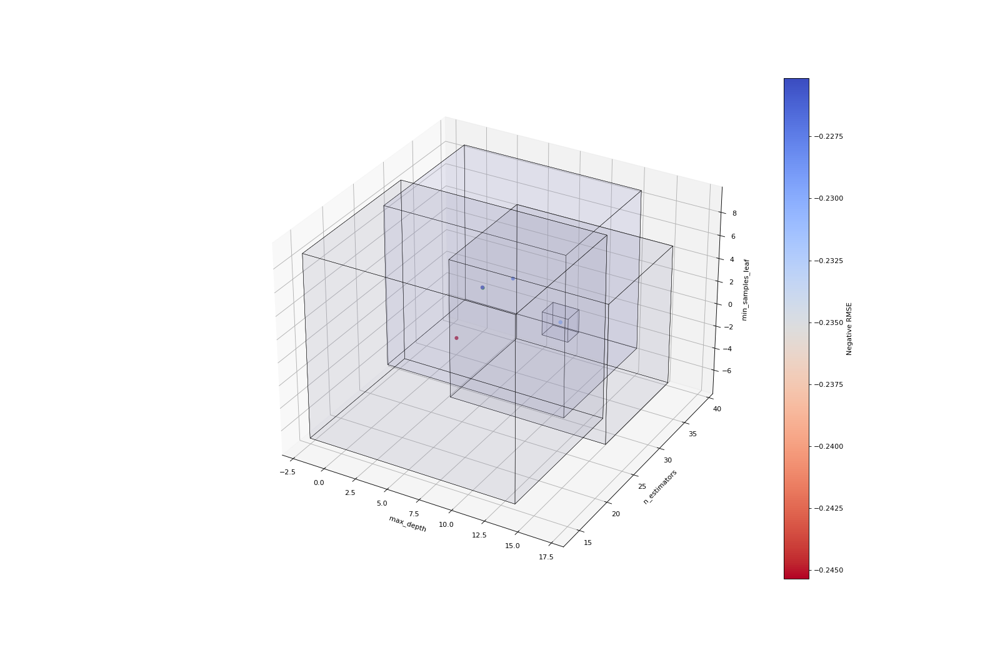

In [49]:
plot_scores_against_params_3d(record_scores_param_sets, record_scores, freg_bp, search_boxes_fills, ['max_depth', 'n_estimators', 'min_samples_leaf'], all_scores=False)

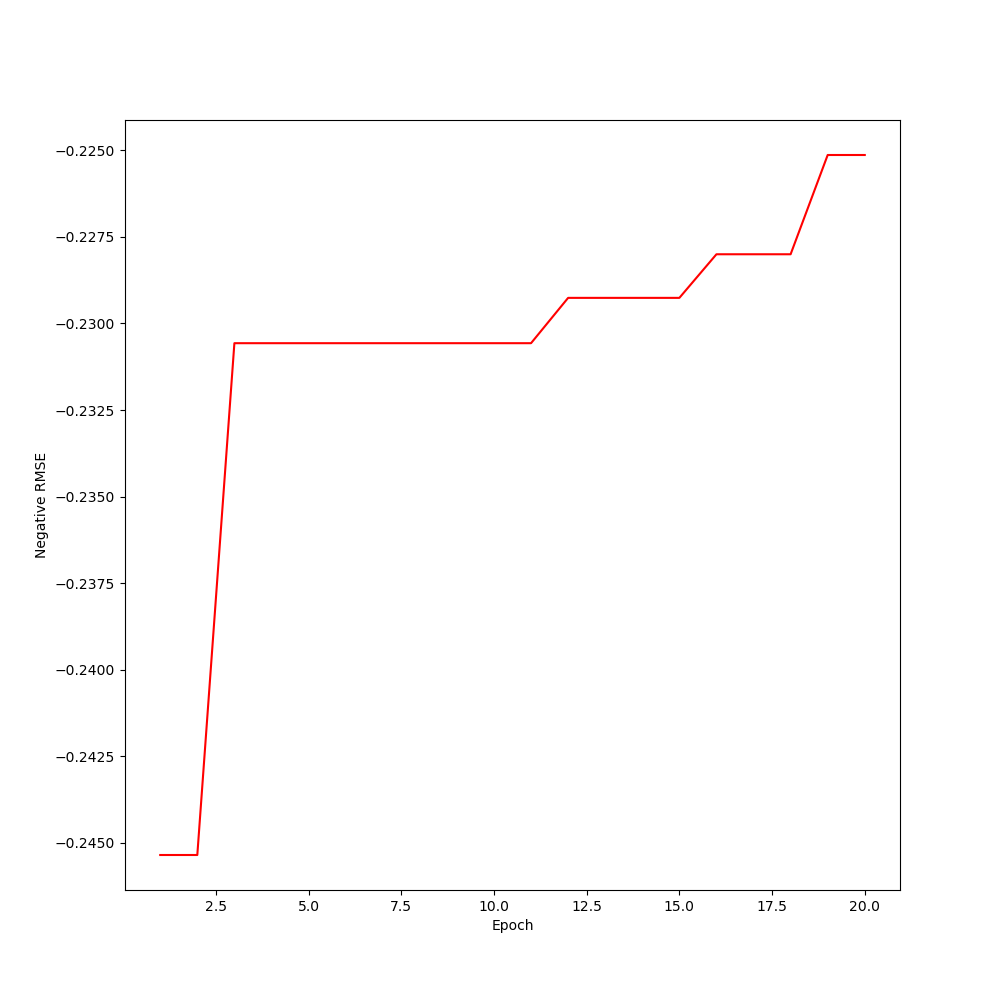

In [50]:
plot_score_per_epoch(epochs)

In [51]:
best_freg = freg_be
best_freg.fit(X_train, y_train)
get_rmse(best_freg, X_train, y_train)
evaluate_on_test(best_freg, X_test, y_test)

RMSE for RandomForestRegressor(max_depth=4, n_estimators=31) = 0.5380
RMSE for RandomForestRegressor(max_depth=4, n_estimators=31) = 0.3363


### [↑ Index](#Index)

# Generated dataset with little noise

In [52]:
df, labels = make_regression(n_samples=200, n_features=50, n_informative=45, noise=3.0, random_state=seed)

In [53]:
df = num_pipeline_no_poly.fit_transform(df)

X_train, X_test, y_train, y_test = tts(df,
                                       labels,
                                       test_size=.20,
                                       random_state=seed)

<a name="gen-not-noisy-svr">
    <h2>SVR</h2>
</a>

<a name="gen-not-noisy-svr-dm">
    <h3>Default Model</h3>
</a>

In [54]:
svr = SVR()
svr.fit(X_train, y_train)
get_rmse(svr, X_train, y_train)
evaluate_on_test(svr, X_test, y_test)

RMSE for SVR() = 306.8325
RMSE for SVR() = 317.1913


<a name="gen-not-noisy-svr-tm">
    <h3>Trained Model</h3>
</a>

In [55]:
svr_be, svr_bp, scores, param_sets, record_scores, record_scores_param_sets, search_boxes_all, search_boxes, search_boxes_fills, epochs = narrowing_grid_search(20)

Iter 1: Score is -84.48629637211648 (better)
Iter 2: Score is -56.95261410643753 (better)
Iter 3: Score is -36.77904794969385 (better)
Iter 4: Score is -25.53350315724069 (better)
Iter 5: Score is -20.281269465032196 (better)
Iter 6: Score is -18.55881240890659 (better)
Iter 7: Score is -17.90277253806076 (better)
Iter 8: Score is -17.693932540056746 (better)
Iter 9: Score is -17.467552675915716 (better)
Iter 10: Score is -17.366855980440697 (better)
Iter 11: Score is -17.34192645278112 (better)
Iter 12: Score is -17.308705338313562 (better)
Iter 13: Score is -17.287372496217085 (better)
Iter 14: Score is -17.261210071430195 (better)
Iter 15: Score is -17.243921984813465 (better)
Iter 16: Score is -17.22641886693101 (better)
Iter 17: Score is -17.223481928785223 (better)
Iter 18: Score is -17.224504750871926 (not better)
Early stopping because within the last 5 iterations, the score has not reduced by 0.5%


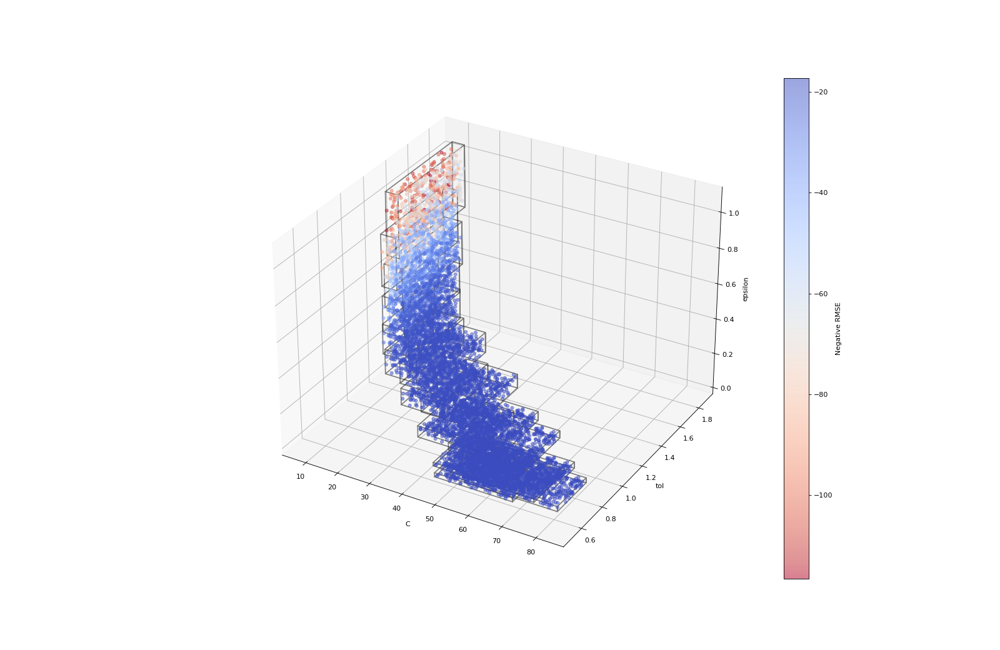

In [56]:
plot_scores_against_params_3d(param_sets, scores, svr_bp, search_boxes_all, ['C', 'tol', 'epsilon'])

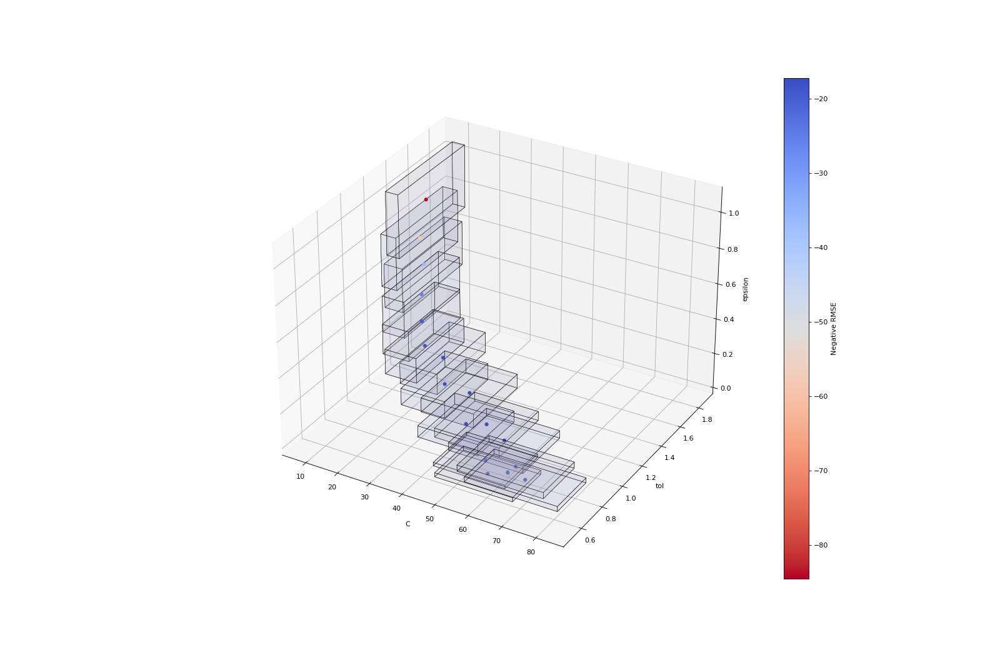

In [57]:
plot_scores_against_params_3d(record_scores_param_sets, record_scores, svr_bp, search_boxes_fills, ['C', 'tol', 'epsilon'], all_scores=False)

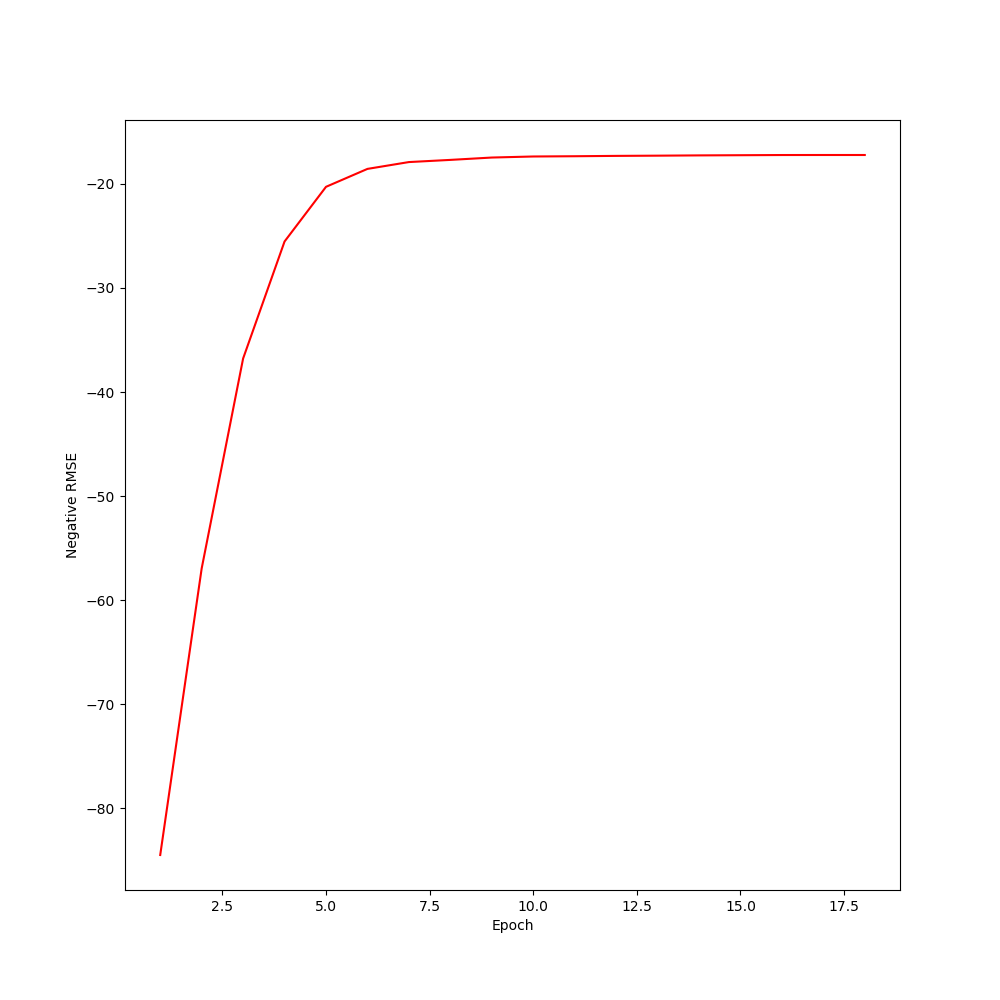

In [58]:
plot_score_per_epoch(epochs)

In [59]:
best_svr = svr_be
best_svr.fit(X_train, y_train)
get_rmse(best_svr, X_train, y_train)
evaluate_on_test(best_svr, X_test, y_test)

RMSE for SVR(C=62.19503240485817, coef0=10, degree=2, epsilon=0.049360345762404514,
    kernel='poly', tol=0.7259310188634372) = 17.2487
RMSE for SVR(C=62.19503240485817, coef0=10, degree=2, epsilon=0.049360345762404514,
    kernel='poly', tol=0.7259310188634372) = 11.0138


<a name="gen-not-noisy-fr">
    <h2>Forest Regression</h2>
</a>

<a name="gen-not-noisy-fr-dm">
    <h3>Default Model</h3>
</a>

In [60]:
#forest regression
freg = RandomForestRegressor(n_estimators=50, random_state=seed)
freg.fit(X_train, y_train)
get_rmse(freg, X_train, y_train)
evaluate_on_test(freg, X_test, y_test)

RMSE for RandomForestRegressor(n_estimators=50, random_state=40) = 271.7661
RMSE for RandomForestRegressor(n_estimators=50, random_state=40) = 279.9894


<a name="gen-not-noisy-fr-tm">
    <h3>Trained Model</h3>
</a>

In [61]:
freg_be, freg_bp, scores, param_sets, record_scores, record_scores_param_sets, search_boxes_all, search_boxes, search_boxes_fills, epochs = narrowing_freg_gs(20)

Iter 1: Score is -69666.17453849177 (better)
Iter 2: Score is -71195.42455228552 (not better)
Iter 3: Score is -71777.33496023591 (not better)
Iter 4: Score is -71831.24851542125 (not better)
Iter 5: Score is -72683.9554975832 (not better)
Iter 6: Score is -70247.93781429368 (not better)
Iter 7: Score is -70597.65887130106 (not better)
Iter 8: Score is -70931.75237421624 (not better)
Iter 9: Score is -70157.88991236161 (not better)
Iter 10: Score is -70762.8726803841 (not better)
Early stopping because the bandwidth of the search has shrunk as much as possible.


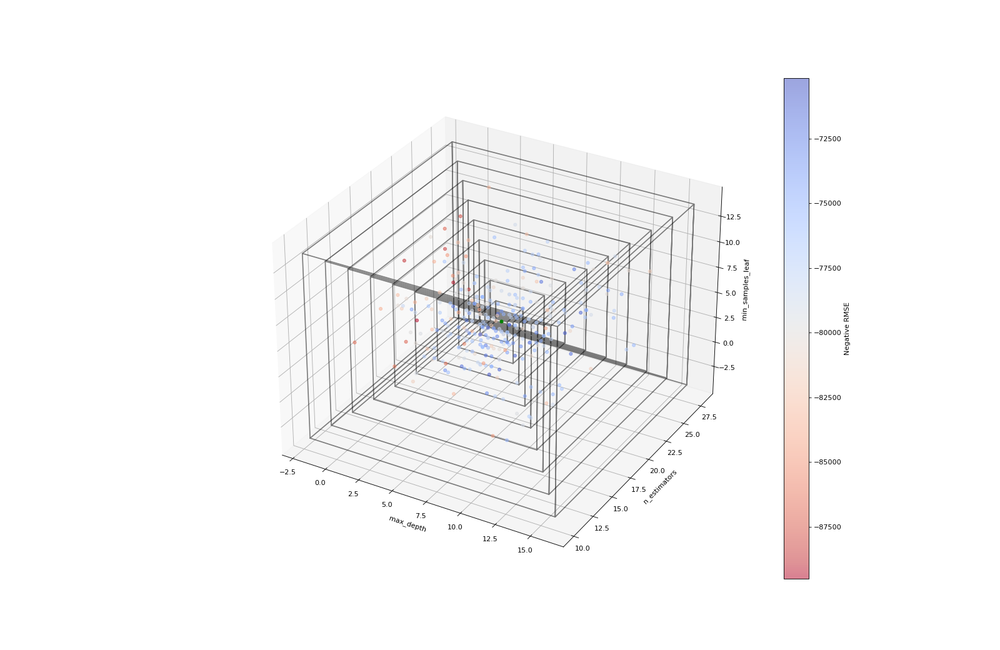

In [62]:
plot_scores_against_params_3d(param_sets, scores, freg_bp, search_boxes_all, ['max_depth', 'n_estimators', 'min_samples_leaf'])

AxisError: axis2: axis 1 is out of bounds for array of dimension 1

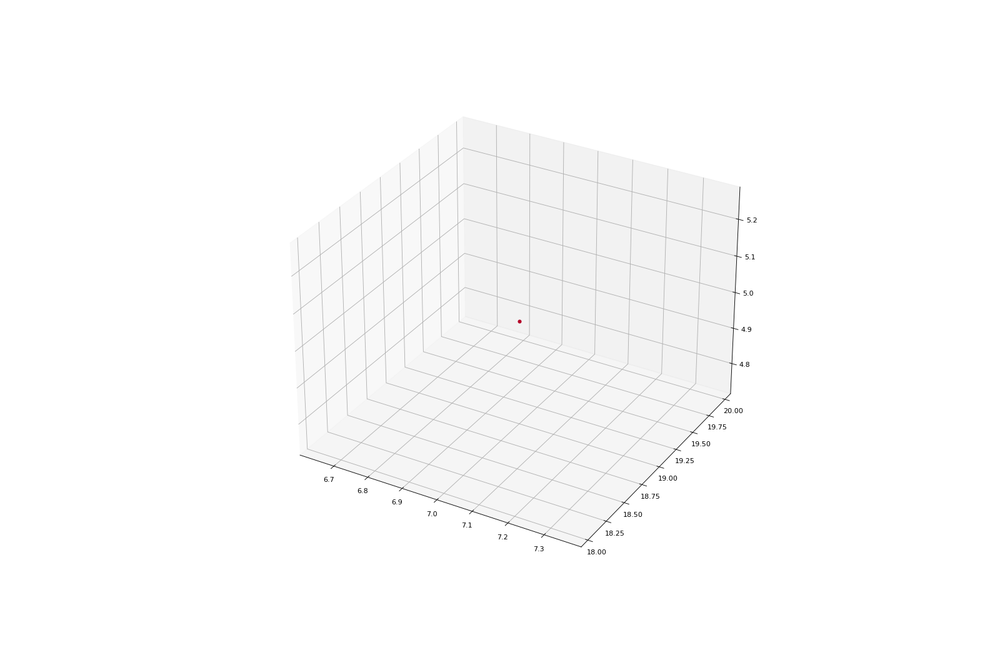

In [63]:
plot_scores_against_params_3d(record_scores_param_sets, record_scores, freg_bp, search_boxes_fills, ['max_depth', 'n_estimators', 'min_samples_leaf'], all_scores=False)

In [ ]:
plot_score_per_epoch(epochs)

In [ ]:
best_freg = freg_be
best_freg.fit(X_train, y_train)
get_rmse(best_freg, X_train, y_train)
evaluate_on_test(best_freg, X_test, y_test)

### [↑ Index](#Index)

# Generated dataset with moderate noise

In [64]:
df, labels = make_regression(n_samples=200, n_features=100, n_informative=60, noise=10.0, random_state=seed)

In [65]:
df = num_pipeline_no_poly.fit_transform(df)

X_train, X_test, y_train, y_test = tts(df,
                                       labels,
                                       test_size=.20,
                                       random_state=seed)

<a name="gen-moderate-noisy-svr">
    <h2>SVR</h2>
</a>

<a name="gen-moderate-noisy-svr-dm">
    <h3>Default Model</h3>
</a>

In [66]:
svr = SVR()
svr.fit(X_train, y_train)
get_rmse(svr, X_train, y_train)
evaluate_on_test(svr, X_test, y_test)

RMSE for SVR() = 457.2231
RMSE for SVR() = 362.8073


<a name="gen-moderate-noisy-svr-tm">
    <h3>Trained Model</h3>
</a>

In [67]:
svr_be, svr_bp, scores, param_sets, record_scores, record_scores_param_sets, search_boxes_all, search_boxes, search_boxes_fills, epochs = narrowing_grid_search(20)

Iter 1: Score is -343.59978772725435 (better)
Iter 2: Score is -324.7144402023583 (better)
Iter 3: Score is -303.3775345195914 (better)
Iter 4: Score is -279.19620178545443 (better)
Iter 5: Score is -257.44867973874943 (better)
Iter 6: Score is -237.3375159167205 (better)
Iter 7: Score is -218.99103339383555 (better)
Iter 8: Score is -201.06038963468072 (better)
Iter 9: Score is -183.35539900926733 (better)
Iter 10: Score is -170.323381040986 (better)
Iter 11: Score is -160.32541734579635 (better)
Iter 12: Score is -153.87667827616906 (better)
Iter 13: Score is -150.5356565896623 (better)
Iter 14: Score is -149.01570668362157 (better)
Iter 15: Score is -148.63131381510365 (better)
Iter 16: Score is -148.51973574853778 (better)
Iter 17: Score is -148.44411196824632 (better)
Iter 18: Score is -148.41321507659873 (better)
Early stopping because within the last 5 iterations, the score has not reduced by 0.5%


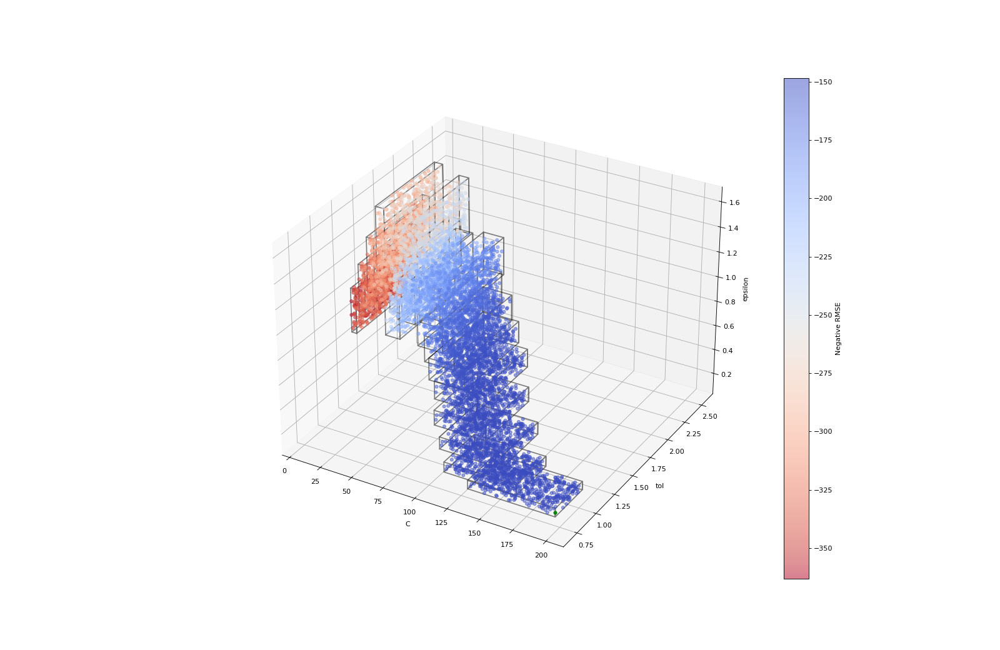

In [68]:
plot_scores_against_params_3d(param_sets, scores, svr_bp, search_boxes_all, ['C', 'tol', 'epsilon'])

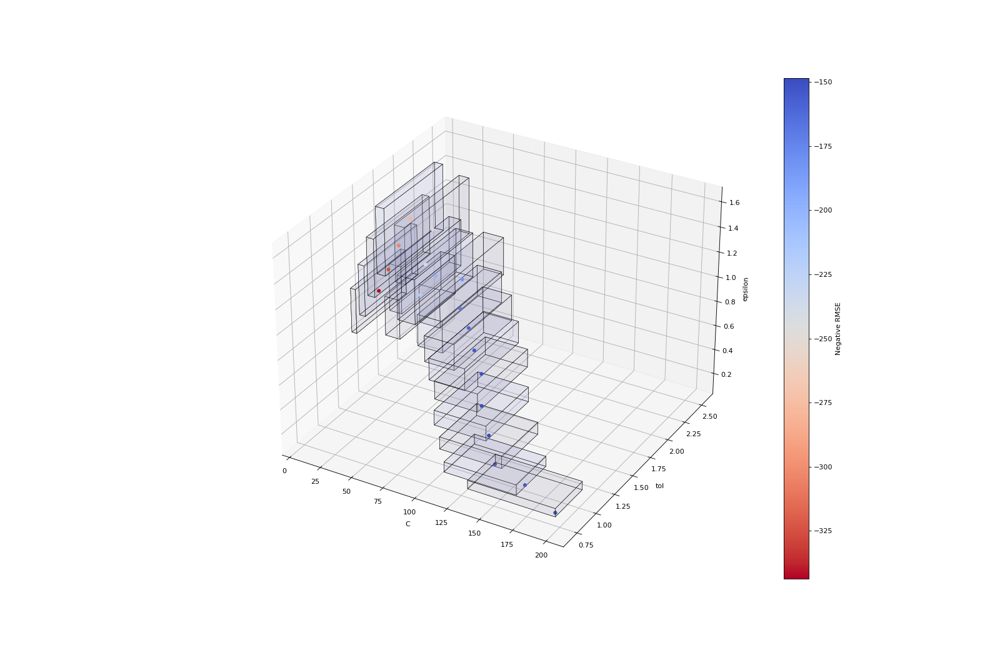

In [69]:
plot_scores_against_params_3d(record_scores_param_sets, record_scores, svr_bp, search_boxes_fills, ['C', 'tol', 'epsilon'], all_scores=False)

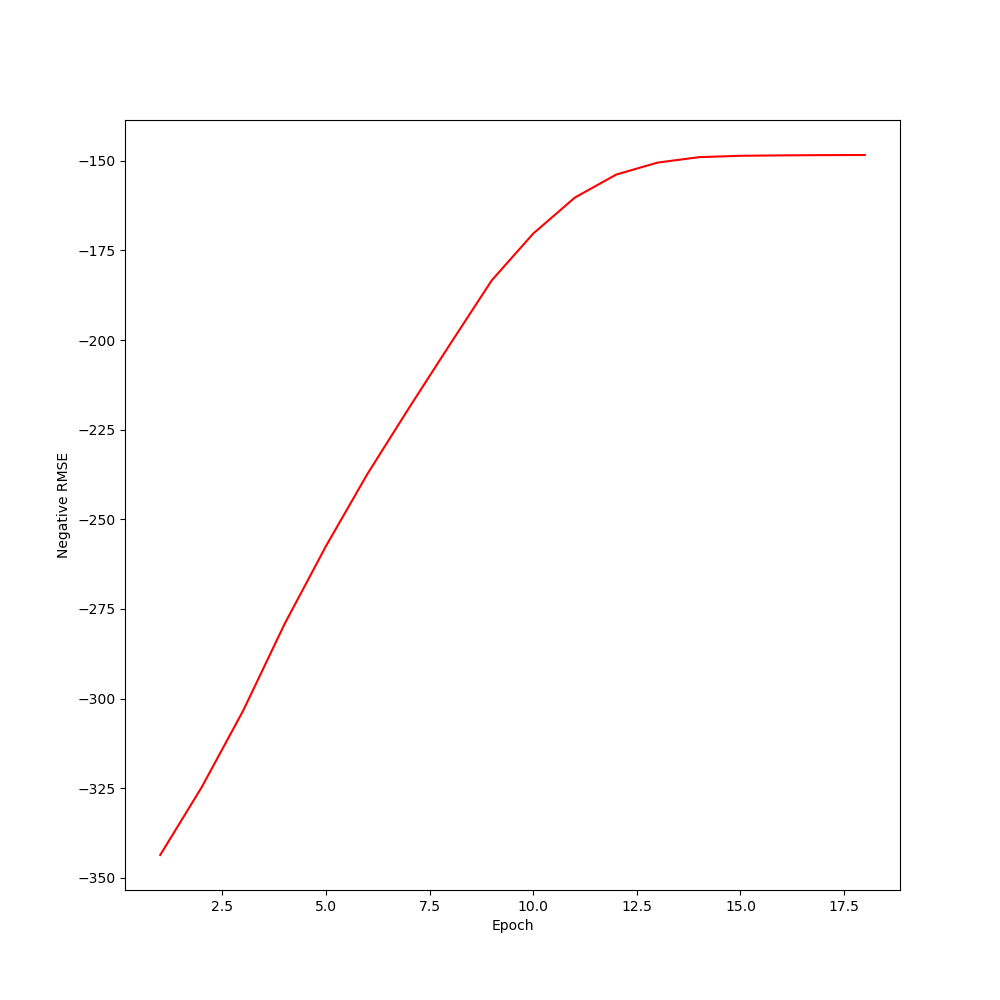

In [70]:
plot_score_per_epoch(epochs)

In [71]:
best_svr = svr_be
best_svr.fit(X_train, y_train)
get_rmse(best_svr, X_train, y_train)
evaluate_on_test(best_svr, X_test, y_test)

RMSE for SVR(C=196.81171046726138, coef0=10, degree=2, epsilon=0.13829815450802535,
    kernel='poly', tol=0.7459350119187613) = 152.2909
RMSE for SVR(C=196.81171046726138, coef0=10, degree=2, epsilon=0.13829815450802535,
    kernel='poly', tol=0.7459350119187613) = 63.7079


<a name="gen-moderate-noisy-fr">
    <h2>Forest Regression</h2>
</a>

<a name="gen-moderate-noisy-fr-dm">
    <h3>Default Model</h3>
</a>

In [ ]:
#forest regression
freg = RandomForestRegressor(n_estimators=50, random_state=seed)
freg.fit(X_train, y_train)
get_rmse(freg, X_train, y_train)
evaluate_on_test(freg, X_test, y_test)

<a name="gen-moderate-noisy-fr-tm">
    <h3>Trained Model</h3>
</a>

In [ ]:
freg_be, freg_bp, scores, param_sets, record_scores, record_scores_param_sets, search_boxes_all, search_boxes, search_boxes_fills, epochs = narrowing_freg_gs(20)

In [ ]:
plot_scores_against_params_3d(param_sets, scores, freg_bp, search_boxes_all, ['max_depth', 'n_estimators', 'min_samples_leaf'])

In [ ]:
plot_scores_against_params_3d(record_scores_param_sets, record_scores, freg_bp, search_boxes_fills, ['max_depth', 'n_estimators', 'min_samples_leaf'], all_scores=False)

In [ ]:
plot_score_per_epoch(epochs)

In [ ]:
best_freg = freg_be
best_freg.fit(X_train, y_train)
get_rmse(best_freg, X_train, y_train)
evaluate_on_test(best_freg, X_test, y_test)

### [↑ Index](#Index)

# Generated dataset with much noise

In [72]:
df, labels = make_regression(n_samples=200, n_features=100, n_informative=10, noise=50.0, random_state=seed)

In [73]:
df = num_pipeline_no_poly.fit_transform(df)

X_train, X_test, y_train, y_test = tts(df,
                                       labels,
                                       test_size=.20,
                                       random_state=seed)

<a name="gen-much-noisy-svr">
    <h2>SVR</h2>
</a>

<a name="gen-much-noisy-svr-dm">
    <h3>Default Model</h3>
</a>

In [74]:
svr = SVR()
svr.fit(X_train, y_train)
get_rmse(svr, X_train, y_train)
evaluate_on_test(svr, X_test, y_test)

RMSE for SVR() = 244.2035
RMSE for SVR() = 220.3669


<a name="gen-much-noisy-svr-tm">
    <h3>Trained Model</h3>
</a>

In [75]:
svr_be, svr_bp, scores, param_sets, record_scores, record_scores_param_sets, search_boxes_all, search_boxes, search_boxes_fills, epochs = narrowing_grid_search(20)

Iter 1: Score is -146.79181623396858 (better)
Iter 2: Score is -140.9332045077787 (better)
Iter 3: Score is -135.92554858667006 (better)
Iter 4: Score is -131.28146995133437 (better)
Iter 5: Score is -125.88174083118626 (better)
Iter 6: Score is -121.23847410279403 (better)
Iter 7: Score is -117.33352658936747 (better)
Iter 8: Score is -114.20783416750403 (better)
Iter 9: Score is -111.38835340110383 (better)
Iter 10: Score is -109.23402597069337 (better)
Iter 11: Score is -107.29676829906442 (better)
Iter 12: Score is -106.21393714496575 (better)
Iter 13: Score is -105.39529883801681 (better)
Iter 14: Score is -105.35103758755146 (better)
Iter 15: Score is -105.33346628975904 (better)
Iter 16: Score is -105.29177931618328 (better)
Iter 17: Score is -105.30868300012439 (not better)
Early stopping because within the last 5 iterations, the score has not reduced by 0.5%


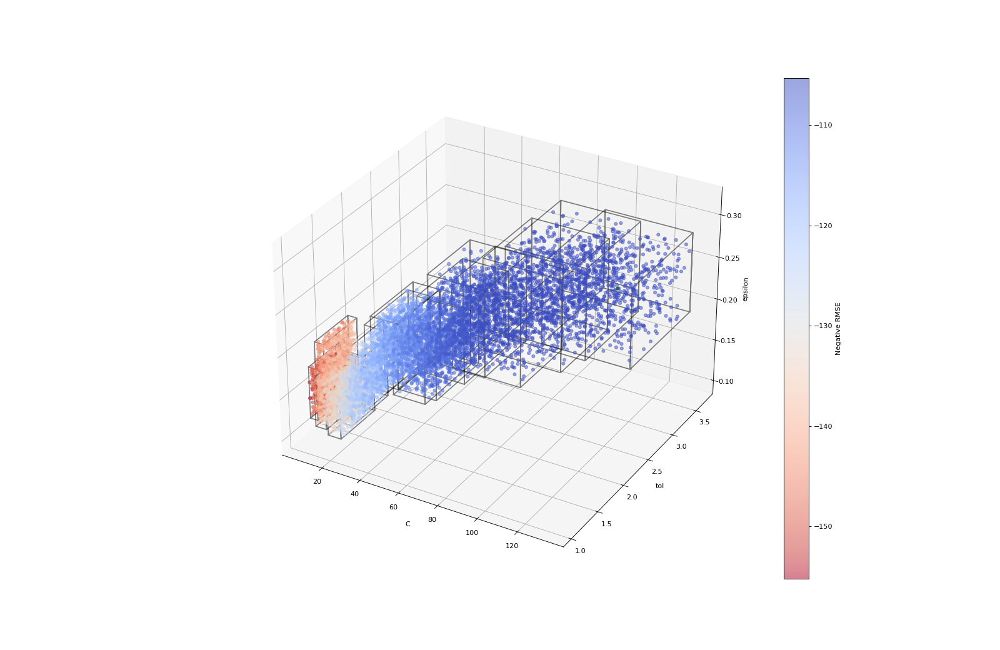

In [76]:
plot_scores_against_params_3d(param_sets, scores, svr_bp, search_boxes_all, ['C', 'tol', 'epsilon'])

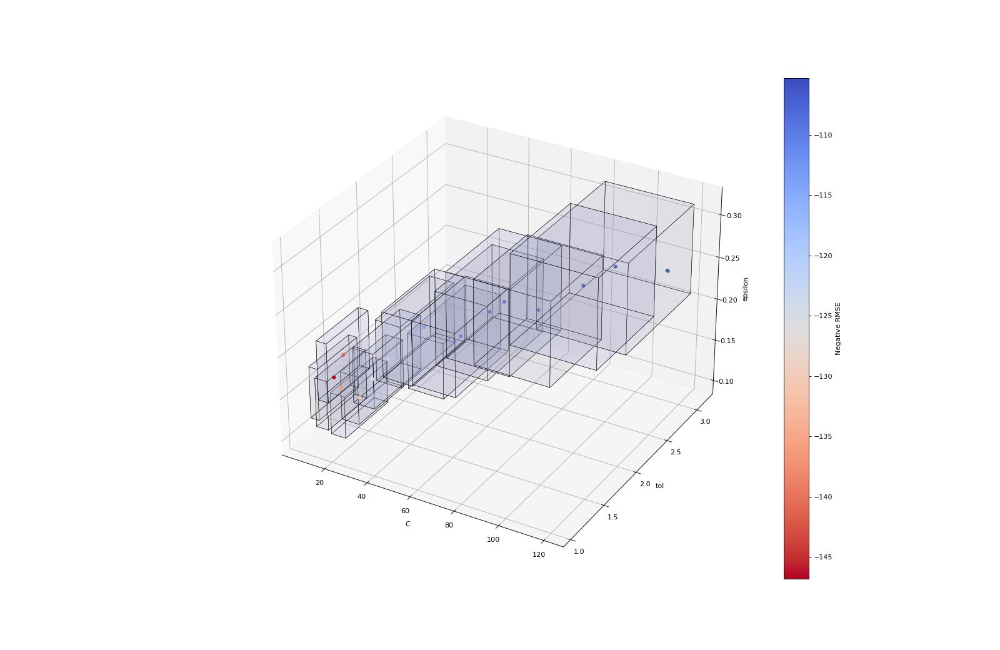

In [77]:
plot_scores_against_params_3d(record_scores_param_sets, record_scores, svr_bp, search_boxes_fills, ['C', 'tol', 'epsilon'], all_scores=False)

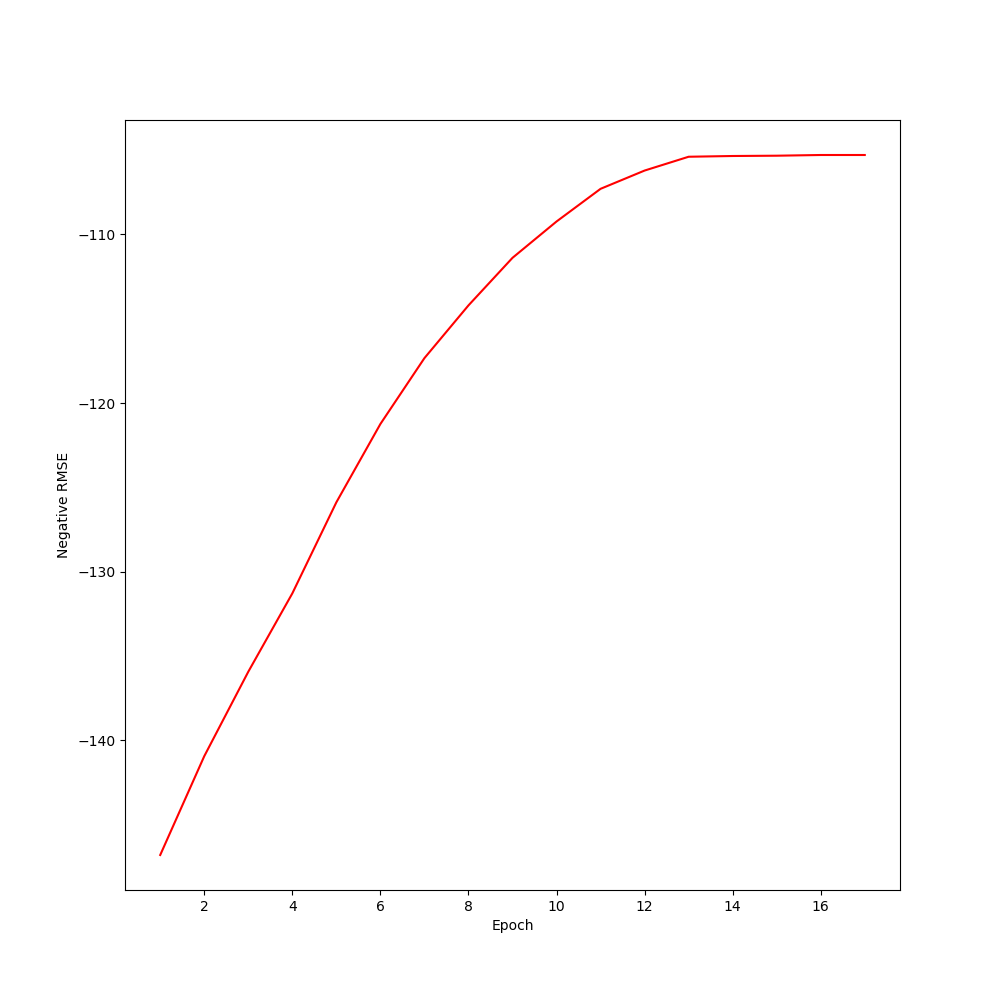

In [78]:
plot_score_per_epoch(epochs)

In [79]:
best_svr = svr_be
best_svr.fit(X_train, y_train)
get_rmse(best_svr, X_train, y_train)
evaluate_on_test(best_svr, X_test, y_test)

RMSE for SVR(C=111.11695357665926, coef0=10, degree=2, epsilon=0.23600393466057587,
    kernel='poly', tol=3.0618011439845296) = 106.4597
RMSE for SVR(C=111.11695357665926, coef0=10, degree=2, epsilon=0.23600393466057587,
    kernel='poly', tol=3.0618011439845296) = 79.9303


<a name="gen-much-noisy-fr">
    <h2>Forest Regression</h2>
</a>

<a name="gen-much-noisy-fr-dm">
    <h3>Default Model</h3>
</a>

In [ ]:
#forest regression
freg = RandomForestRegressor(n_estimators=50, random_state=seed)
freg.fit(X_train, y_train)
get_rmse(freg, X_train, y_train)
evaluate_on_test(freg, X_test, y_test)

<a name="gen-much-noisy-fr-tm">
    <h3>Trained Model</h3>
</a>

In [ ]:
freg_be, freg_bp, scores, param_sets, record_scores, record_scores_param_sets, search_boxes_all, search_boxes, search_boxes_fills, epochs = narrowing_freg_gs(20)

In [ ]:
plot_scores_against_params_3d(param_sets, scores, freg_bp, search_boxes_all, ['max_depth', 'n_estimators', 'min_samples_leaf'])

In [ ]:
plot_scores_against_params_3d(record_scores_param_sets, record_scores, freg_bp, search_boxes_fills, ['max_depth', 'n_estimators', 'min_samples_leaf'], all_scores=False)

In [ ]:
plot_score_per_epoch(epochs)

In [ ]:
best_freg = freg_be
best_freg.fit(X_train, y_train)
get_rmse(best_freg, X_train, y_train)
evaluate_on_test(best_freg, X_test, y_test)

### [↑ Index](#Index)

# USA tech companies

In [80]:
df = pd.read_csv('Top 50 US Tech Companies 2022 - 2023.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 10 columns):
 #   Column                                            Non-Null Count  Dtype  
---  ------                                            --------------  -----  
 0   Company Name                                      50 non-null     object 
 1   Industry                                          50 non-null     object 
 2   Sector                                            50 non-null     object 
 3   HQ State                                          50 non-null     object 
 4   Founding Year                                     50 non-null     int64  
 5   Annual Revenue 2022-2023 (USD in Billions)        50 non-null     float64
 6   Market Cap (USD in Trillions)                     50 non-null     float64
 7   Stock Name                                        50 non-null     object 
 8   Annual Income Tax in 2022-2023 (USD in Billions)  50 non-null     float64
 9   Employee Size          

In [81]:
#Split into test and training
labels = df['Annual Revenue 2022-2023 (USD in Billions)'].copy()
df = df.drop(columns=['Annual Revenue 2022-2023 (USD in Billions)', 'Company Name', 'Stock Name'])

num_attribs = ["Founding Year",
               "Market Cap (USD in Trillions)",
               "Annual Income Tax in 2022-2023 (USD in Billions)",
               "Employee Size"]

cat_attribs = ["Industry", "Sector", "HQ State"]

full_pipeline = ColumnTransformer([
        ("num", num_pipeline, num_attribs),
        ("cat", OneHotEncoder(), cat_attribs),
    ])

df = full_pipeline.fit_transform(df)

X_train, X_test, y_train, y_test = tts(df,
                                       labels,
                                       test_size=.20,
                                       random_state=seed)

<a name="usa-tech-svr">
    <h2>SVR</h2>
</a>

<a name="usa-tech-svr-dm">
    <h3>Default Model</h3>
</a>

In [82]:
svr = SVR()
svr.fit(X_train, y_train)
get_rmse(svr, X_train, y_train)
evaluate_on_test(svr, X_test, y_test)

RMSE for SVR() = 88.5524
RMSE for SVR() = 144.4811


<a name="usa-tech-svr-tm">
    <h3>Trained Model</h3>
</a>

In [83]:
svr_be, svr_bp, scores, param_sets, record_scores, record_scores_param_sets, search_boxes_all, search_boxes, search_boxes_fills, epochs = narrowing_grid_search(20)

Iter 1: Score is -36.07891825529857 (better)
Iter 2: Score is -34.95914926435508 (better)
Iter 3: Score is -34.5699355157826 (better)
Iter 4: Score is -34.490693486886734 (better)
Iter 5: Score is -34.21807629938062 (better)
Iter 6: Score is -34.41205341115387 (not better)
Iter 7: Score is -34.22577998426244 (not better)
Iter 8: Score is -34.26119068314956 (not better)
Iter 9: Score is -34.157415850166046 (better)
Early stopping because within the last 5 iterations, the score has not reduced by 0.5%


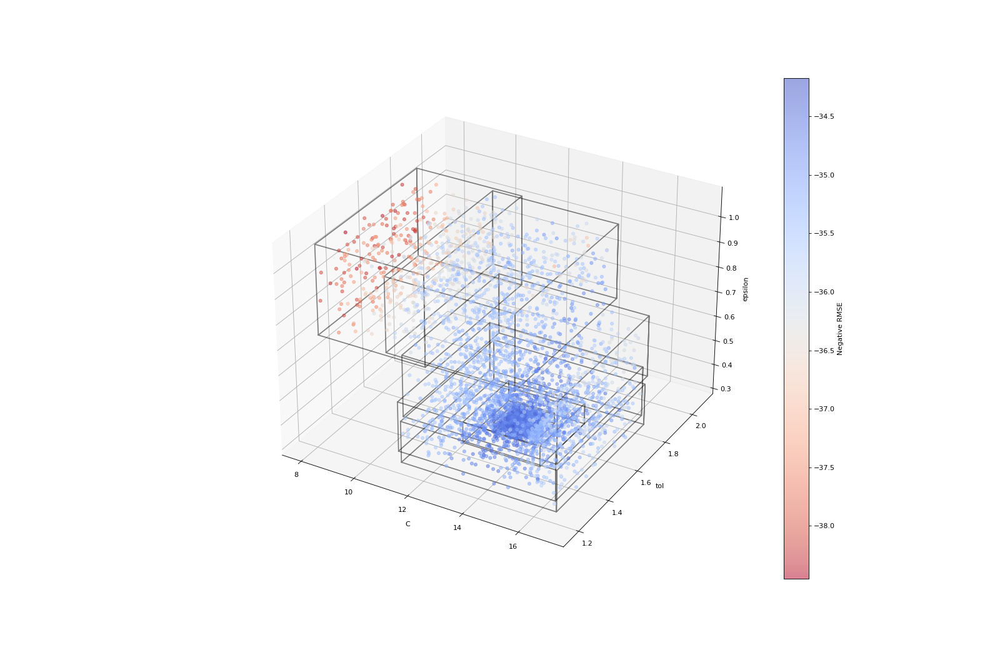

In [84]:
plot_scores_against_params_3d(param_sets, scores, svr_bp, search_boxes_all, ['C', 'tol', 'epsilon'])

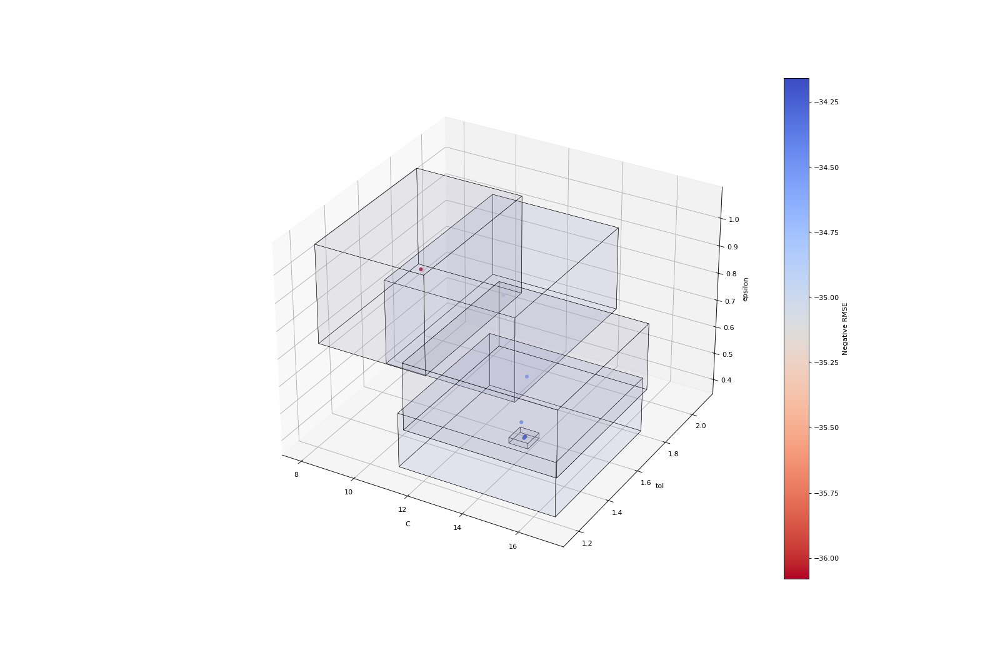

In [85]:
plot_scores_against_params_3d(record_scores_param_sets, record_scores, svr_bp, search_boxes_fills, ['C', 'tol', 'epsilon'], all_scores=False)

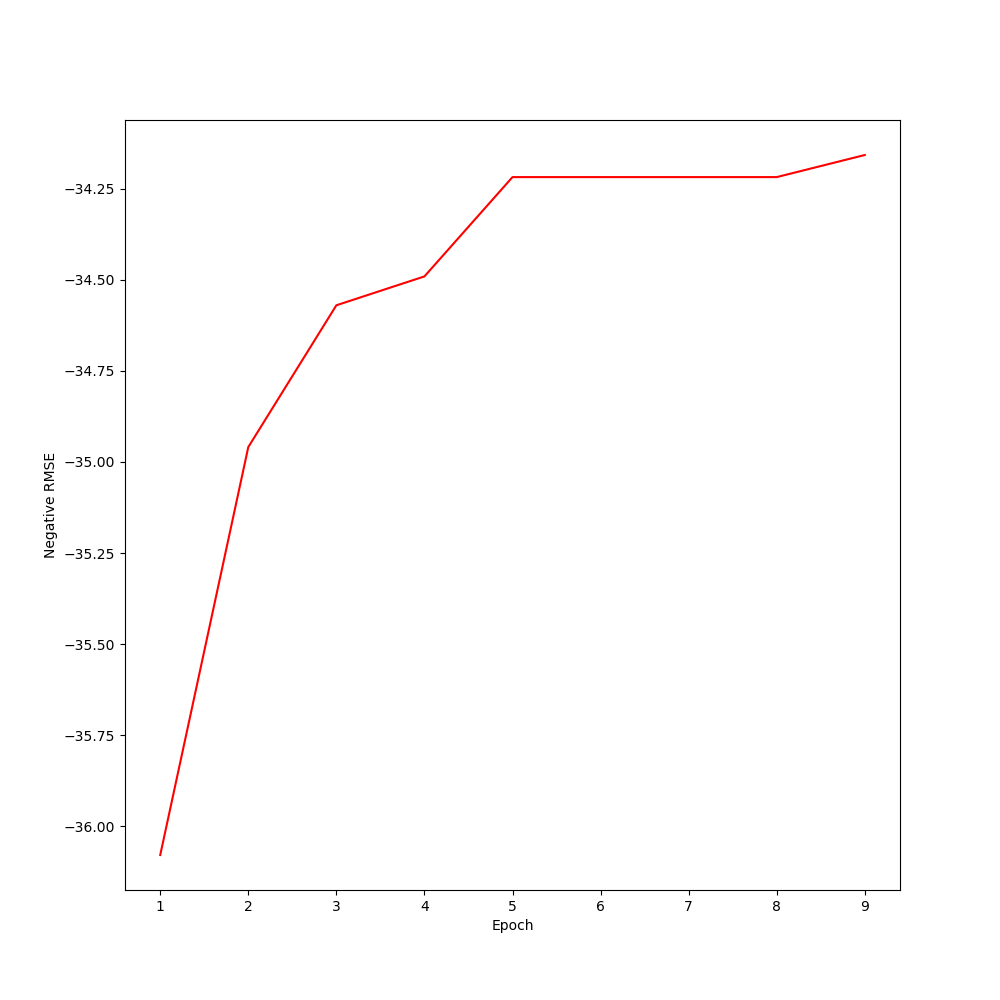

In [86]:
plot_score_per_epoch(epochs)

In [87]:
best_svr = svr_be
best_svr.fit(X_train, y_train)
get_rmse(best_svr, X_train, y_train)
evaluate_on_test(best_svr, X_test, y_test)

RMSE for SVR(C=14.064518676734483, coef0=10, degree=2, epsilon=0.4207745109641473,
    kernel='poly', tol=1.4920210423648792) = 38.4224
RMSE for SVR(C=14.064518676734483, coef0=10, degree=2, epsilon=0.4207745109641473,
    kernel='poly', tol=1.4920210423648792) = 94.5668


<a name="usa-tech-fr">
    <h2>Forest Regression</h2>
</a>

<a name="usa-tech-fr-dm">
    <h3>Default Model</h3>
</a>

In [ ]:
#forest regression
freg = RandomForestRegressor(n_estimators=50, random_state=seed)
freg.fit(X_train, y_train)
get_rmse(freg, X_train, y_train)
evaluate_on_test(freg, X_test, y_test)

<a name="usa-tech-fr-tm">
    <h3>Trained Model</h3>
</a>

In [ ]:
freg_be, freg_bp, scores, param_sets, record_scores, record_scores_param_sets, search_boxes_all, search_boxes, search_boxes_fills, epochs = narrowing_freg_gs(20)

In [ ]:
plot_scores_against_params_3d(param_sets, scores, freg_bp, search_boxes_all, ['max_depth', 'n_estimators', 'min_samples_leaf'])

In [ ]:
plot_scores_against_params_3d(record_scores_param_sets, record_scores, freg_bp, search_boxes_fills, ['max_depth', 'n_estimators', 'min_samples_leaf'], all_scores=False)

In [ ]:
plot_score_per_epoch(epochs)

In [ ]:
best_freg = freg_be
best_freg.fit(X_train, y_train)
get_rmse(best_freg, X_train, y_train)
evaluate_on_test(best_freg, X_test, y_test)

### [↑ Index](#Index)

# Research Summary

| Dataset | Default SVR Test RMSE | Trained SVR Test RMSE | SVR RMSE Reduction | Default FR Test RMSE | Trained FR Test RMSE | FR RMSE reduction |
| --- | --- | --- | --- | --- | --- | --- |
| Suicides per pop | 0.3413 | 0.3099 | 20.33% | 0.3211 | 0.3439 | NA |
| Generated dataset with little noise | 317.1913 | 10.9758 | 96.54% | 284.4449 | 315.4658 | NA |
| Generate dataset with moderate noise | 362.8073 | 63.3903 | 82.53% | 335.4542 | 334.8542 | NA (did get better though) |
| Generated dataset with much noise | 220.3669 | 79.2648 | 64.03% | 161.3520 | 166.0208 | NA |
| USA tech companies | 144.4811 | 97.3320 | 32.63% | 85.7092 | 65.3050 | 23.81% |

<a name="p2-conclusions">
    <h1>Conclusions</h1>
</a>

In conclusion, some observations worth noting:
* Forest regression method needs help. Likely, forest regression as a model does not lend itself well to this type of approach given that each hyperparameter domain is not continuous. This makes the approach behave oddly (it is a step function more than a fine-grained optimization).
* On the SVR side, performance scales unsurprisingly with dataset size; the two datasets here not from `make_regression` are much smaller.
* Also on the SVR side, performance scales with noise. The percentage decrease in RMSE steadily goes down as noise goes up. However, given how high the numbers are, this is hardly discouraging!
* Looking at the scores per epoch, it is clear that  at some point the cost of an iteration is giving such a minimal increase in RMSE that it's no longer worth performing.

Future work:
* Surely, there are optimization methods for forest regression... this one needs more work
* Early stopping for these optimization problems is worth implementing.


### [↑ Index](#Index)

In [88]:
end_time = time.time()

total_time = end_time - start_time

print(f"Total run time from start to finish: {total_time:.1f} seconds ({total_time/60:.1f} minutes).")

Total run time from start to finish: 5941.2 seconds (99.0 minutes).
